In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("MMM_demo_data.csv")

In [3]:
print(df.shape)
df.head()

(1504, 70)


,calendardate,nasdaq,sp500,dj_ind,ggl_app_dwnlds,apl_app_dwnlds,ttl_app_dwnlds,vix,emv,newbizstarts,...,soc_li_core_clk,soc_tw_core_spd,soc_tw_core_imp,soc_tw_core_clk,soc_pin_core_spd,soc_pin_core_imp,soc_pin_core_clk,seo_brand_core_clicks,seo_brand_core_impressions,qbo_direct_signup
0,8/1/2017,6362.94,2476.35,21963.92,17.1,7.3,24.4,10.09,0.47176,267790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,181039.10390
1,8/2/2017,6362.65,2477.57,22016.24,17.1,7.3,24.4,10.28,0.47176,267790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,199928.34040
2,8/3/2017,6340.34,2472.16,22026.10,17.1,7.3,24.4,10.44,0.47176,267790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,191843.52120
3,8/4/2017,6351.56,2476.83,22092.81,17.1,7.3,24.4,10.03,0.47176,267790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,157688.96690
4,8/5/2017,0.00,0.00,0.00,17.1,7.3,24.4,0.00,0.47176,267790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67901.12728


In [4]:
df['qbo_direct_signup'].mean()

224981.55605609043

In [5]:
df['calendardate'].max()

'9/9/2021'

In [6]:
df.dtypes

calendardate                   object
nasdaq                        float64
sp500                         float64
dj_ind                        float64
ggl_app_dwnlds                float64
                               ...   
soc_pin_core_imp              float64
soc_pin_core_clk              float64
seo_brand_core_clicks         float64
seo_brand_core_impressions    float64
qbo_direct_signup             float64
Length: 70, dtype: object

In [7]:
df['calendardate'] = pd.to_datetime(df['calendardate'])

In [8]:
df.describe()

,nasdaq,sp500,dj_ind,ggl_app_dwnlds,apl_app_dwnlds,ttl_app_dwnlds,vix,emv,newbizstarts,covid_shtdwn,...,soc_li_core_clk,soc_tw_core_spd,soc_tw_core_imp,soc_tw_core_clk,soc_pin_core_spd,soc_pin_core_imp,soc_pin_core_clk,seo_brand_core_clicks,seo_brand_core_impressions,qbo_direct_signup
count,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,...,1504.000000,1.504000e+03,1.504000e+03,1.504000e+03,1.504000e+03,1.504000e+03,1504.000000,1.504000e+03,1.504000e+03,1504.000000
mean,6370.638915,2146.629129,18586.231496,22.850931,7.928457,30.779388,13.308989,0.697996,335127.823803,0.013963,...,17725.837175,3.361143e+05,3.047624e+07,4.974502e+04,3.640863e+04,3.004573e+06,8600.255505,2.344655e+06,5.075474e+06,224981.556056
std,4777.344179,1512.608821,12866.063898,4.241918,0.651393,4.764223,11.760945,0.698868,79559.300711,0.117375,...,38412.649567,5.991556e+05,5.715224e+07,1.408560e+05,1.885043e+05,1.545398e+07,41645.463380,1.857538e+06,3.762066e+06,89151.736569
min,0.000000,0.000000,0.000000,17.100000,7.100000,24.400000,0.000000,0.000000,236454.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,47518.010550
25%,0.000000,0.000000,0.000000,19.400000,7.400000,27.000000,0.000000,0.209010,286241.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,6.929748e+05,2.006945e+06,165123.606150
50%,7426.455000,2744.365000,24855.585000,21.300000,7.800000,28.700000,13.520000,0.490850,294371.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2.388247e+06,5.855659e+06,220660.071850
75%,8986.217500,3113.585000,27077.955000,28.200000,8.500000,36.400000,19.512500,0.883870,408164.000000,0.000000,...,12278.266117,4.474063e+05,3.719798e+07,2.619305e+04,0.000000e+00,0.000000e+00,0.000000,3.821591e+06,8.290590e+06,281076.643400
max,15374.330000,4536.950000,35625.400000,28.700000,9.300000,37.800000,82.690000,3.951730,551657.000000,1.000000,...,255072.972600,4.535395e+06,4.729760e+08,1.432899e+06,3.257040e+06,2.752331e+08,593703.047700,1.315493e+07,2.496978e+07,535561.476400


In [9]:
missing_data = df.isnull().sum()
missing_data

calendardate                  0
nasdaq                        0
sp500                         0
dj_ind                        0
ggl_app_dwnlds                0
                             ..
soc_pin_core_imp              0
soc_pin_core_clk              0
seo_brand_core_clicks         0
seo_brand_core_impressions    0
qbo_direct_signup             0
Length: 70, dtype: int64

In [10]:
#dict(df.nunique())

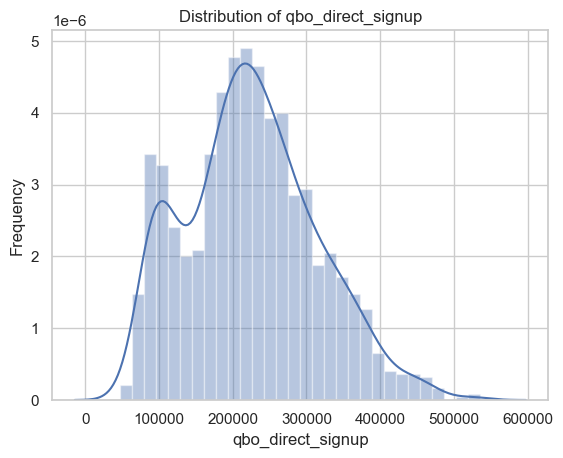

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and 'qbo_direct_signup' is the column you want to plot
sns.set(style="whitegrid")  # Optional: Set the seaborn style

# Create the distribution plot
sns.distplot(df['qbo_direct_signup'], bins=30)  # You can adjust the number of bins

# Add labels and title
plt.title('Distribution of qbo_direct_signup')
plt.xlabel('qbo_direct_signup')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [12]:
df_analysis = df

In [13]:
df_analysis.columns

Index(['calendardate', 'nasdaq', 'sp500', 'dj_ind', 'ggl_app_dwnlds',
       'apl_app_dwnlds', 'ttl_app_dwnlds', 'vix', 'emv', 'newbizstarts',
       'covid_shtdwn', 'promo_QBESPulse', 'promo_labday', 'promo_tax',
       'promo_cybmon', 'promo_presday', 'promo_memday', 'promo_indday',
       'promo_supflash', 'promo_march', 'promo_covid', 'acct_pck5for5',
       'acct_pck3for10', 'web_lineup_rollout', 'test_reimagineMVP',
       'qbl_empower', 'qbl_agentshortage', 'test_reimagineMVP_2',
       'price_diff_qbo_plus', 'aff_ttl_qbo_spd', 'dis_ttl_spd', 'dis_ttl_imp',
       'vid_ttl_spd', 'vid_ttl_imp', 'rad_spd', 'rad_imp',
       'aud_ttl_nogobig_spd', 'aud_ttl_nogobig_imp', 'ott_spd', 'ott_imp',
       'ppc_brd_ttl_spd', 'ppc_brd_ttl_imp', 'ppc_brd_ttl_clk',
       'ppc_nbrd_ttl_spd', 'ppc_nbrd_ttl_imp', 'ppc_nbrd_ttl_clk',
       'tv_ttl_nfl_spd', 'tv_ttl_nfl_imp', 'tv_ttl_nfl_grps',
       'tv_ttl_drtv_spd', 'tv_ttl_drtv_imp', 'tv_ttl_drtv_grps',
       'tv_ttl_upfront_spd', 'tv_ttl_

In [14]:
df_analysis['spd_sum'] = df_analysis['aff_ttl_qbo_spd']+df_analysis['dis_ttl_spd']+df_analysis['vid_ttl_spd']+df_analysis['rad_spd']+df_analysis['aud_ttl_nogobig_spd']+df_analysis['ott_spd']+df_analysis['ppc_brd_ttl_spd']+df_analysis['ppc_nbrd_ttl_spd']+df_analysis['tv_ttl_nfl_spd']+df_analysis['tv_ttl_drtv_spd']+df_analysis['tv_ttl_upfront_spd']+df_analysis['fb_ttl_core_spd']+df_analysis['soc_li_core_spd']+df_analysis['soc_tw_core_spd']+df_analysis['soc_pin_core_spd']
df_analysis['imp_sum'] = df_analysis['dis_ttl_imp']+df_analysis['vid_ttl_imp']+df_analysis['rad_imp']+df_analysis['rad_spd']+df_analysis['aud_ttl_nogobig_imp']+df_analysis['ott_imp']+df_analysis['ppc_brd_ttl_imp']+df_analysis['ppc_nbrd_ttl_imp']+df_analysis['tv_ttl_nfl_imp']+df_analysis['tv_ttl_drtv_imp']+df_analysis['tv_ttl_upfront_imp']+df_analysis['fb_ttl_core_imp']+df_analysis['soc_li_core_imp']+df_analysis['soc_tw_core_imp']+df_analysis['soc_pin_core_imp']+df_analysis['seo_brand_core_impressions']
df_analysis['clk_sum'] = df_analysis['ppc_brd_ttl_clk']+df_analysis['ppc_nbrd_ttl_clk']+df_analysis['fb_ttl_core_clk']+df_analysis['soc_li_core_clk']+df_analysis['soc_tw_core_clk']+df_analysis['soc_pin_core_clk']

In [15]:
df_analysis['spd_sum']/df_analysis['qbo_direct_signup']

0       135.027543
1       124.425750
2       124.158172
3       113.384422
4       150.438409
           ...    
1499    127.042309
1500    120.337111
1501    119.130583
1502    129.358106
1503    129.358485
Length: 1504, dtype: float64

In [16]:
df_analysis['year'] = df_analysis['calendardate'].dt.year
df_analysis['month'] = df_analysis['calendardate'].dt.month

In [17]:
df_analysis_groupby = df_analysis.groupby(['year', 'month'])['qbo_direct_signup'].sum().reset_index()
df_analysis_groupby['year_month'] = df_analysis_groupby['year'].astype(str) + '-' + df_analysis_groupby['month'].astype(str)
df_analysis_groupby = df_analysis_groupby.set_index('year_month')

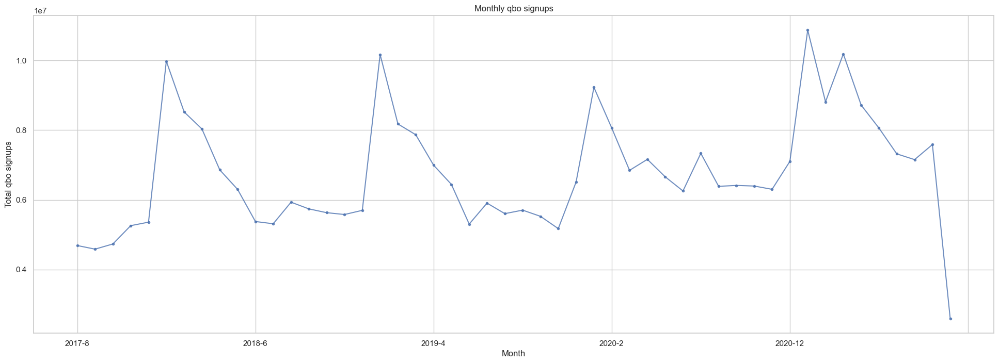

In [18]:
plt.figure(figsize=(24,8))
df_analysis_groupby['qbo_direct_signup'].plot(alpha=0.8, marker='.', linestyle='-')
plt.title('Monthly qbo signups')
plt.ylabel('Total qbo signups')
plt.xlabel('Month')
plt.show()

In [19]:
df_analysis_groupby_spd = df_analysis.groupby(['year', 'month'])['spd_sum'].sum().reset_index()
df_analysis_groupby_spd['year_month'] = df_analysis_groupby_spd['year'].astype(str) + '-' + df_analysis_groupby_spd['month'].astype(str)
df_analysis_groupby_spd = df_analysis_groupby_spd.drop(['year', 'month'], axis=1)
#df_analysis_groupby_spd = df_analysis_groupby_spd.set_index('year_month')

In [20]:
df_analysis_groupby_imp = df_analysis.groupby(['year', 'month'])['imp_sum'].sum().reset_index()
df_analysis_groupby_imp['year_month'] = df_analysis_groupby_imp['year'].astype(str) + '-' + df_analysis_groupby_imp['month'].astype(str)
df_analysis_groupby_imp = df_analysis_groupby_imp.drop(['year', 'month', 'year_month'], axis=1)
#df_analysis_groupby_spd = df_analysis_groupby_spd.set_index('year_month')

In [21]:
df_analysis_groupby_clk = df_analysis.groupby(['year', 'month'])['clk_sum'].sum().reset_index()
df_analysis_groupby_clk['year_month'] = df_analysis_groupby_clk['year'].astype(str) + '-' + df_analysis_groupby_clk['month'].astype(str)
df_analysis_groupby_clk = df_analysis_groupby_clk.drop(['year', 'month', 'year_month'], axis=1)
#df_analysis_groupby_spd = df_analysis_groupby_spd.set_index('year_month')

In [22]:
df_analysis_groupby_2 = pd.concat([df_analysis_groupby_spd, df_analysis_groupby_imp, df_analysis_groupby_clk], axis=1)

In [23]:
df_analysis_groupby_2['ctr'] = df_analysis_groupby_2['clk_sum']/df_analysis_groupby_2['imp_sum']

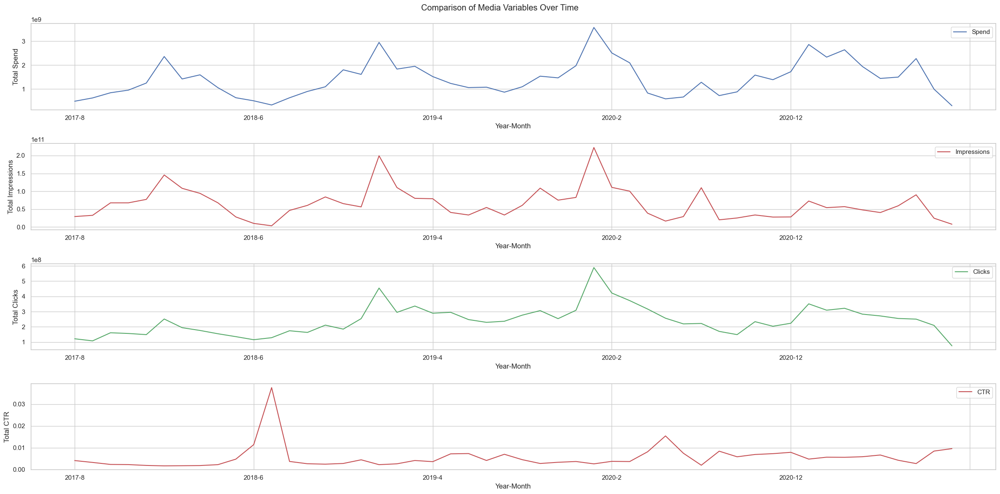

In [24]:
import matplotlib.pyplot as plt

# Set the figure size using subplots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(24, 12))

# Create the line plot with twin y-axes
df_analysis_groupby_2.plot(x="year_month", y="spd_sum", ax=ax1, legend=False)
df_analysis_groupby_2.plot(x="year_month", y="imp_sum", ax=ax2, legend=False, color="r")
df_analysis_groupby_2.plot(x="year_month", y="clk_sum", ax=ax3, legend=False, color="g")
df_analysis_groupby_2.plot(x="year_month", y="ctr", ax=ax4, legend=False, color="r")


# Add legends for each subplot
ax1.legend(['Spend'])
ax2.legend(['Impressions'])
ax3.legend(['Clicks'])
ax4.legend(['CTR'])


# Set titles and labels
plt.suptitle('Comparison of Media Variables Over Time')
ax1.set_xlabel('Year-Month')
ax1.set_ylabel('Total Spend')
ax2.set_xlabel('Year-Month')
ax2.set_ylabel('Total Impressions')
ax3.set_xlabel('Year-Month')
ax3.set_ylabel('Total Clicks')
ax4.set_xlabel('Year-Month')
ax4.set_ylabel('Total CTR')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

In [25]:
df_analysis_2018 = pd.concat([df_analysis[df_analysis['year'] == 2018].loc[:, df_analysis.columns.str.endswith('_spd')],df_analysis[df_analysis['year'] == 2018]['qbo_direct_signup']], axis=1)
df_analysis_2019 = pd.concat([df_analysis[df_analysis['year'] == 2019].loc[:, df_analysis.columns.str.endswith('_spd')],df_analysis[df_analysis['year'] == 2019]['qbo_direct_signup']], axis=1)
df_analysis_2020 = pd.concat([df_analysis[df_analysis['year'] == 2020].loc[:, df_analysis.columns.str.endswith('_spd')],df_analysis[df_analysis['year'] == 2020]['qbo_direct_signup']], axis=1)

df_analysis_2018_sum = df_analysis_2018.sum().reset_index()
df_analysis_2019_sum = df_analysis_2019.sum().reset_index()
df_analysis_2020_sum = df_analysis_2020.sum().reset_index()

df_analysis_2018_sum['year'] = 2018
df_analysis_2019_sum['year'] = 2019
df_analysis_2020_sum['year'] = 2020

df_analysis_sum = pd.concat([df_analysis_2018_sum, df_analysis_2019_sum, df_analysis_2020_sum], axis=0).reset_index()

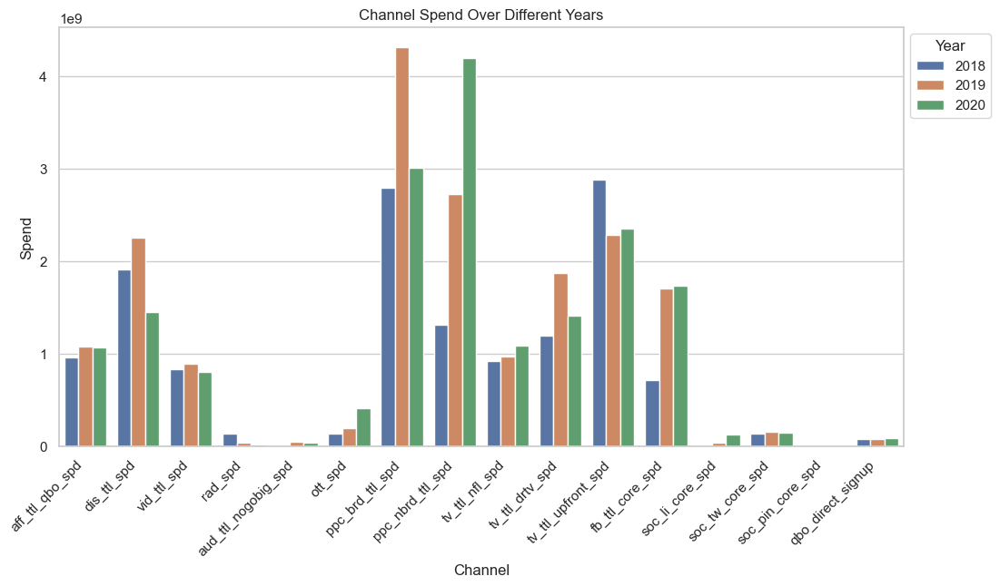

In [26]:
plt.figure(figsize=(12, 6))
sns.barplot(x='index', y=0, hue='year', data=df_analysis_sum)

# Adding labels and title
plt.title('Channel Spend Over Different Years')
plt.xlabel('Channel')
plt.ylabel('Spend')
plt.xticks(rotation=45, ha='right')

# Displaying the legend
plt.legend(title='Year', bbox_to_anchor=(1, 1), loc='upper left')

# Show the plot
plt.show()

In [27]:
df_analysis_2018 = pd.concat([df_analysis[df_analysis['year'] == 2018].loc[:, df_analysis.columns.str.endswith('_imp')],df_analysis[df_analysis['year'] == 2018]['qbo_direct_signup']], axis=1)
df_analysis_2019 = pd.concat([df_analysis[df_analysis['year'] == 2019].loc[:, df_analysis.columns.str.endswith('_imp')],df_analysis[df_analysis['year'] == 2019]['qbo_direct_signup']], axis=1)
df_analysis_2020 = pd.concat([df_analysis[df_analysis['year'] == 2020].loc[:, df_analysis.columns.str.endswith('_imp')],df_analysis[df_analysis['year'] == 2020]['qbo_direct_signup']], axis=1)

df_analysis_2018_sum = df_analysis_2018.sum().reset_index()
df_analysis_2019_sum = df_analysis_2019.sum().reset_index()
df_analysis_2020_sum = df_analysis_2020.sum().reset_index()

df_analysis_2018_sum['year'] = 2018
df_analysis_2019_sum['year'] = 2019
df_analysis_2020_sum['year'] = 2020

df_analysis_sum = pd.concat([df_analysis_2018_sum, df_analysis_2019_sum, df_analysis_2020_sum], axis=0).reset_index()

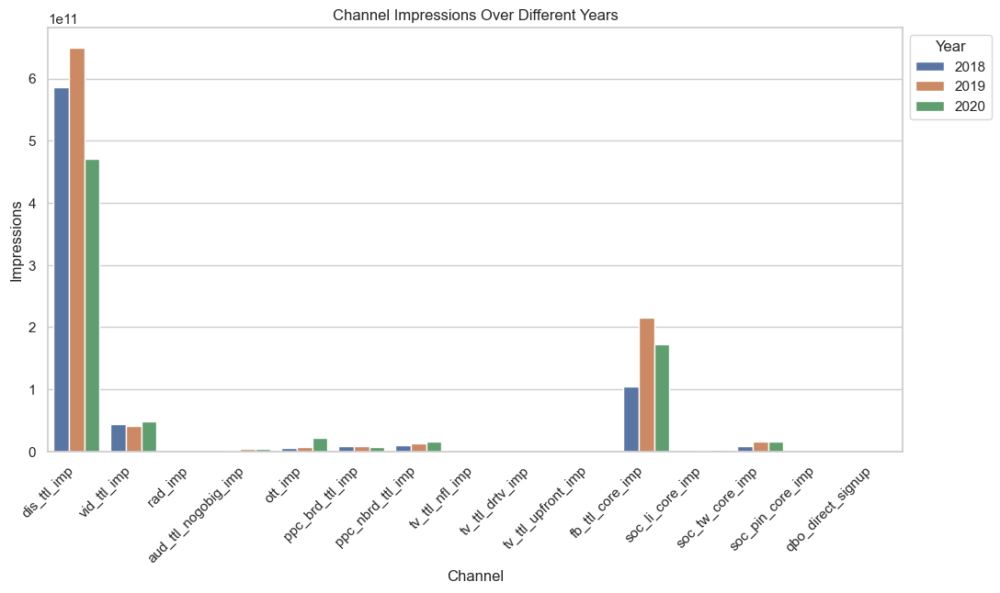

In [28]:
plt.figure(figsize=(12, 6))
sns.barplot(x='index', y=0, hue='year', data=df_analysis_sum)

# Adding labels and title
plt.title('Channel Impressions Over Different Years')
plt.xlabel('Channel')
plt.ylabel('Impressions')
plt.xticks(rotation=45, ha='right')

# Displaying the legend
plt.legend(title='Year', bbox_to_anchor=(1, 1), loc='upper left')

# Show the plot
plt.show()

In [29]:
df_analysis.columns

Index(['calendardate', 'nasdaq', 'sp500', 'dj_ind', 'ggl_app_dwnlds',
       'apl_app_dwnlds', 'ttl_app_dwnlds', 'vix', 'emv', 'newbizstarts',
       'covid_shtdwn', 'promo_QBESPulse', 'promo_labday', 'promo_tax',
       'promo_cybmon', 'promo_presday', 'promo_memday', 'promo_indday',
       'promo_supflash', 'promo_march', 'promo_covid', 'acct_pck5for5',
       'acct_pck3for10', 'web_lineup_rollout', 'test_reimagineMVP',
       'qbl_empower', 'qbl_agentshortage', 'test_reimagineMVP_2',
       'price_diff_qbo_plus', 'aff_ttl_qbo_spd', 'dis_ttl_spd', 'dis_ttl_imp',
       'vid_ttl_spd', 'vid_ttl_imp', 'rad_spd', 'rad_imp',
       'aud_ttl_nogobig_spd', 'aud_ttl_nogobig_imp', 'ott_spd', 'ott_imp',
       'ppc_brd_ttl_spd', 'ppc_brd_ttl_imp', 'ppc_brd_ttl_clk',
       'ppc_nbrd_ttl_spd', 'ppc_nbrd_ttl_imp', 'ppc_nbrd_ttl_clk',
       'tv_ttl_nfl_spd', 'tv_ttl_nfl_imp', 'tv_ttl_nfl_grps',
       'tv_ttl_drtv_spd', 'tv_ttl_drtv_imp', 'tv_ttl_drtv_grps',
       'tv_ttl_upfront_spd', 'tv_ttl_

In [30]:
df_analysis_2018.shape

(365, 15)

In [31]:
# Defining segments
non_media_channel = ['calendardate','nasdaq',  'sp500','dj_ind', 'ggl_app_dwnlds', 'apl_app_dwnlds', 'ttl_app_dwnlds','vix',  'emv', 'newbizstarts',  'covid_shtdwn', 'promo_QBESPulse',  'promo_labday', 'promo_tax', 'promo_cybmon', 'promo_presday', 'promo_memday', 'promo_indday', 'promo_supflash', 'promo_march','promo_covid', 'acct_pck5for5',
                     'acct_pck3for10',  'web_lineup_rollout',  'test_reimagineMVP',  'qbl_empower','qbl_agentshortage' ,'test_reimagineMVP_2', 'price_diff_qbo_plus', 'qbo_direct_signup']

# Define criteria for each segment
top_funnel_channels = ['calendardate','dis_ttl_spd','dis_ttl_imp', 'vid_ttl_spd','vid_ttl_imp', 'rad_spd','rad_imp', 'aud_ttl_nogobig_spd','aud_ttl_nogobig_imp', 'ott_spd','ott_imp', 'qbo_direct_signup',  'seo_brand_core_clicks','seo_brand_core_impressions']
middle_funnel_channels = ['calendardate','fb_ttl_core_spd','fb_ttl_core_imp','fb_ttl_core_clk', 'soc_li_core_spd','soc_li_core_imp','soc_li_core_clk','soc_tw_core_spd','soc_tw_core_imp','soc_tw_core_clk','soc_pin_core_spd','soc_pin_core_imp','soc_pin_core_clk','qbo_direct_signup']
bottom_funnel_channels = ['calendardate','aff_ttl_qbo_spd','ppc_brd_ttl_spd','ppc_brd_ttl_imp', 'ppc_brd_ttl_clk', 'ppc_nbrd_ttl_spd','ppc_nbrd_ttl_imp','ppc_nbrd_ttl_clk', 'tv_ttl_nfl_spd', 'tv_ttl_nfl_imp', 'tv_ttl_nfl_grps', 'tv_ttl_drtv_spd',  'tv_ttl_drtv_imp', 'tv_ttl_drtv_grps',  'tv_ttl_upfront_spd',  'tv_ttl_upfront_imp',  'tv_ttl_upfront_grps', 'qbo_direct_signup']

# Segmentation based on channel categories/
non_media_data = df[non_media_channel]

top_funnel_data = df[top_funnel_channels]
middle_funnel_data = df[middle_funnel_channels]
bottom_funnel_data = df[bottom_funnel_channels]

<Axes: >

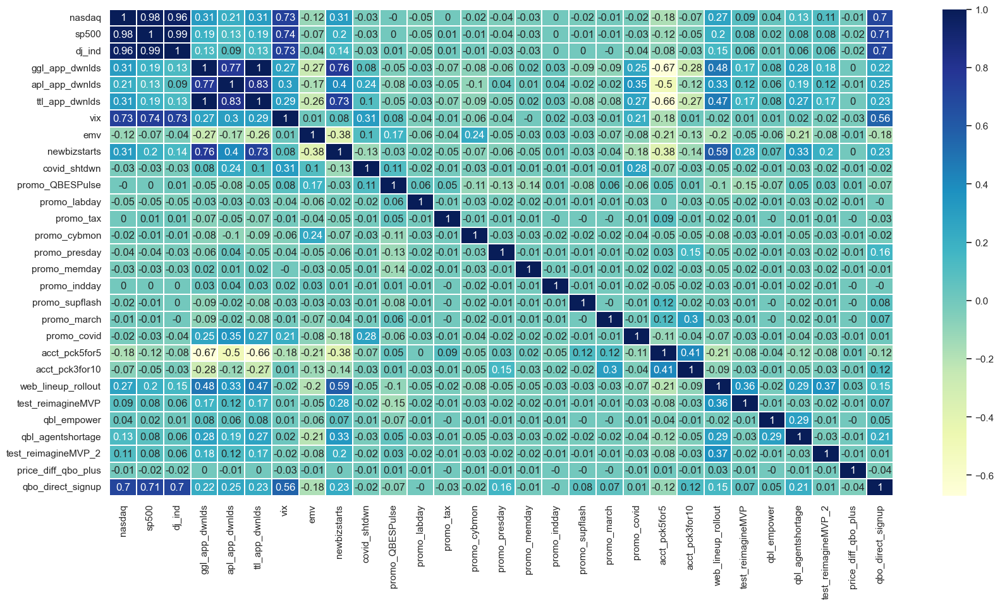

In [32]:
# Check correlation between variables

non_media_data_corr = round(non_media_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(20,10))

sns.heatmap(non_media_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

In [33]:
non_media_data.columns

Index(['calendardate', 'nasdaq', 'sp500', 'dj_ind', 'ggl_app_dwnlds',
       'apl_app_dwnlds', 'ttl_app_dwnlds', 'vix', 'emv', 'newbizstarts',
       'covid_shtdwn', 'promo_QBESPulse', 'promo_labday', 'promo_tax',
       'promo_cybmon', 'promo_presday', 'promo_memday', 'promo_indday',
       'promo_supflash', 'promo_march', 'promo_covid', 'acct_pck5for5',
       'acct_pck3for10', 'web_lineup_rollout', 'test_reimagineMVP',
       'qbl_empower', 'qbl_agentshortage', 'test_reimagineMVP_2',
       'price_diff_qbo_plus', 'qbo_direct_signup'],
      dtype='object')

In [34]:
non_media_data['promo_combine'] = non_media_data['promo_QBESPulse']+non_media_data['promo_labday']+non_media_data['promo_tax']+non_media_data['promo_cybmon']+non_media_data['promo_presday']+non_media_data['promo_memday']+non_media_data['promo_indday']+non_media_data['promo_supflash']+non_media_data['promo_march']+non_media_data['promo_covid']

In [35]:
def replace(num):
    if num==0:
        return 0
    else:
        return 1
non_media_data['promo'] = non_media_data['promo_combine'].apply(lambda x: replace(x))    

In [36]:
non_media_data['promo'].value_counts()

1    983
0    521
Name: promo, dtype: int64

In [37]:
non_media_data['month'] = non_media_data['calendardate'].dt.month

<Axes: >

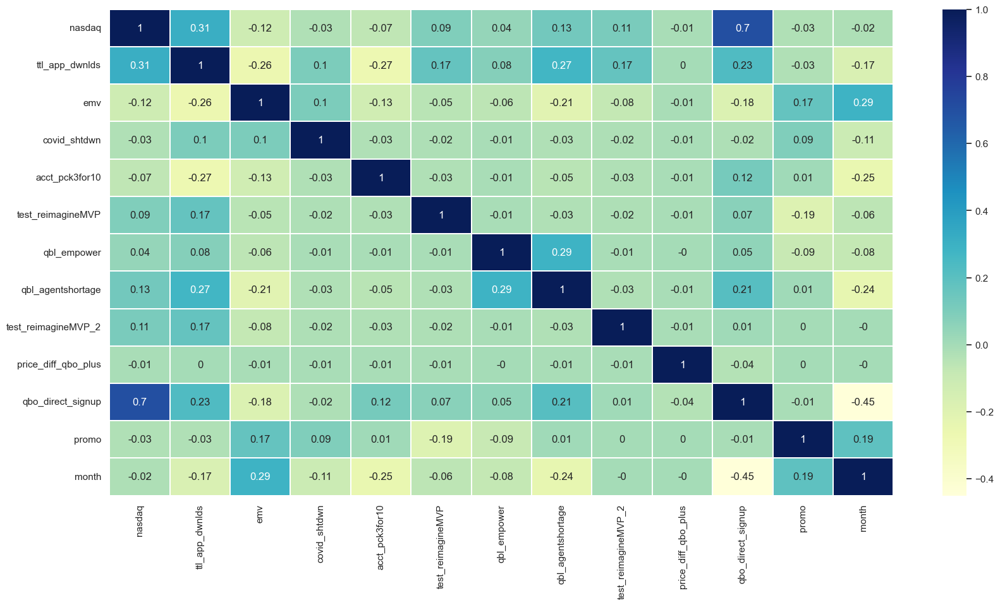

In [38]:
# remove highly correlated variables
non_media_data = non_media_data.drop(['promo_combine','promo_QBESPulse', 'promo_labday', 'promo_tax', 'promo_cybmon','promo_presday', 'promo_memday', 'promo_indday', 'promo_supflash',
       'promo_march', 'promo_covid','sp500', 'dj_ind', 'vix', 'ggl_app_dwnlds', 'apl_app_dwnlds', 'newbizstarts', 'web_lineup_rollout', 'acct_pck5for5'], axis=1)

# Check correlation between variables

non_media_data_corr = round(non_media_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(20,10))

sns.heatmap(non_media_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

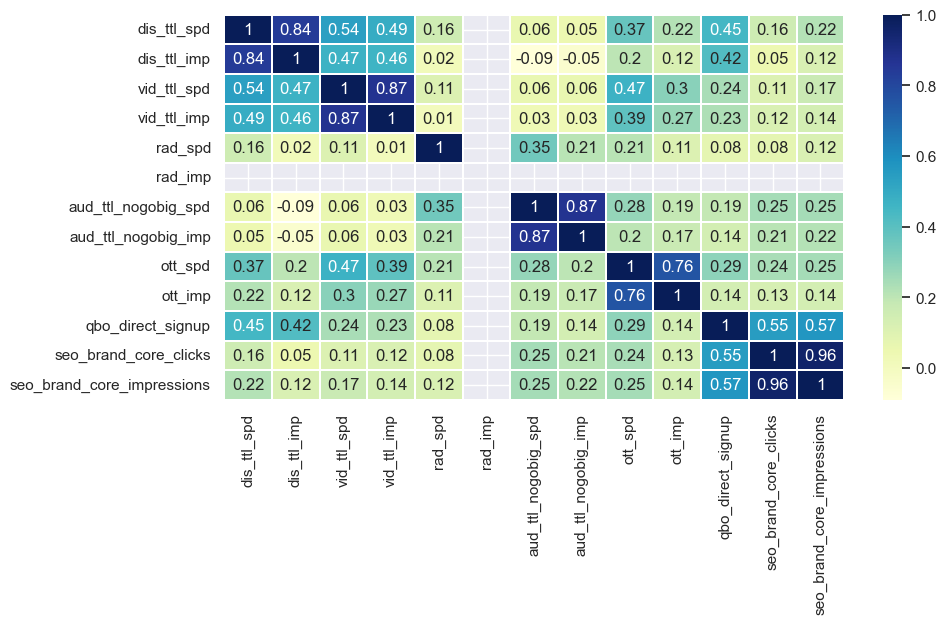

In [39]:
# Check correlation between variables

top_funnel_data_corr = round(top_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(10,5))

sns.heatmap(top_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

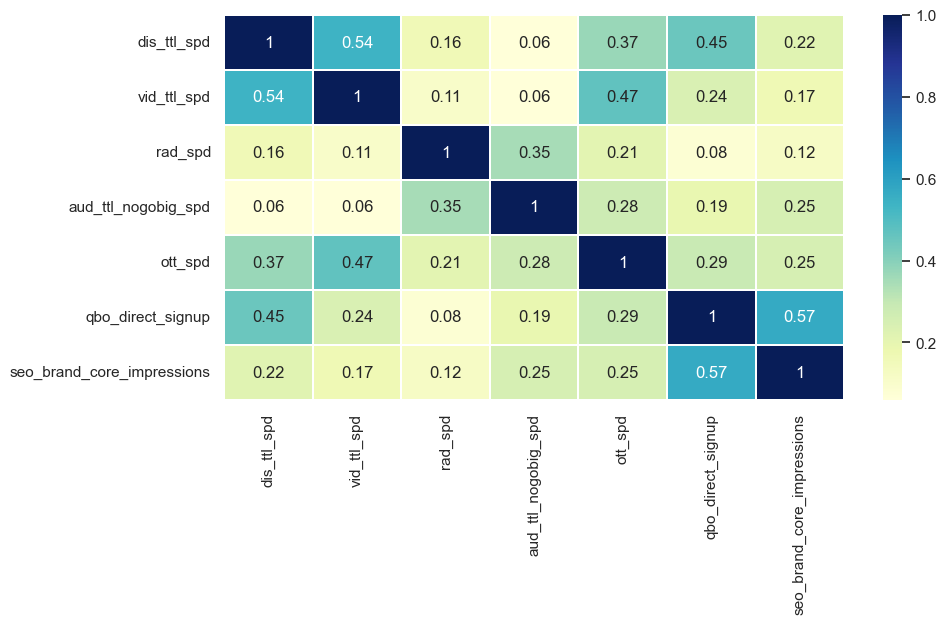

In [40]:
# remove highly correlated variables
top_funnel_data_copy = top_funnel_data.copy()
top_funnel_data = top_funnel_data.drop(['dis_ttl_imp', 'vid_ttl_imp', 'rad_imp', 'aud_ttl_nogobig_imp', 'ott_imp', 'seo_brand_core_clicks'], axis=1)

# Check correlation between variables

top_funnel_data_corr = round(top_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(10,5))

sns.heatmap(top_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

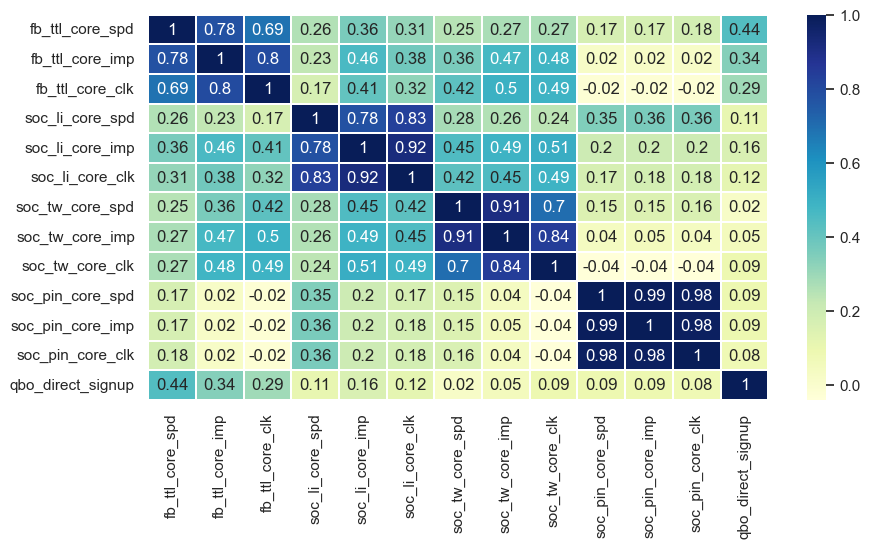

In [41]:
# Check correlation between variables

middle_funnel_data_corr = round(middle_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(10,5))

sns.heatmap(middle_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

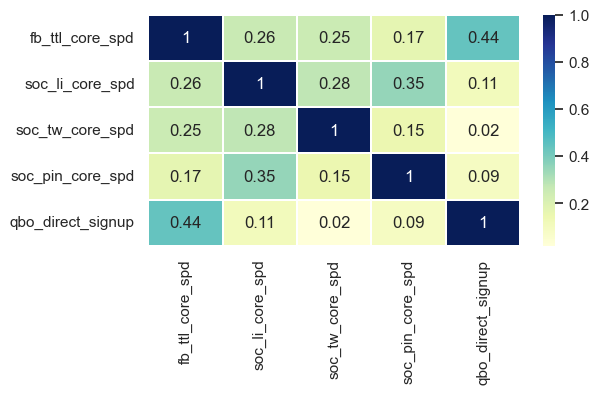

In [42]:
# remove highly correlated variables
middle_funnel_data_copy = middle_funnel_data.copy()
middle_funnel_data = middle_funnel_data.drop(['fb_ttl_core_imp', 'fb_ttl_core_clk', 'soc_li_core_imp', 'soc_li_core_clk', 'soc_tw_core_imp', 'soc_tw_core_clk', 'soc_pin_core_imp', 'soc_pin_core_clk'], axis=1)

# Check correlation between variables

middle_funnel_data_corr = round(middle_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(6,3))

sns.heatmap(middle_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

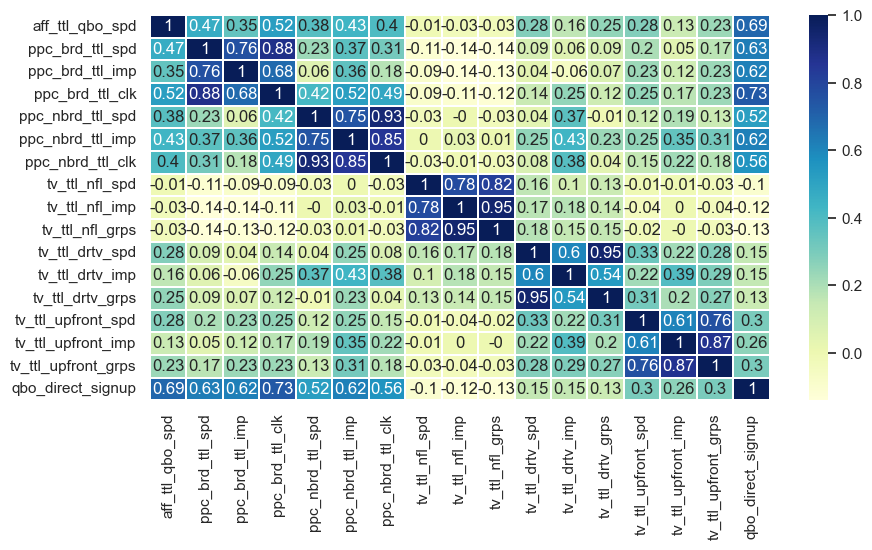

In [43]:
# Check correlation between variables

bottom_funnel_data_corr = round(bottom_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(10,5))

sns.heatmap(bottom_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

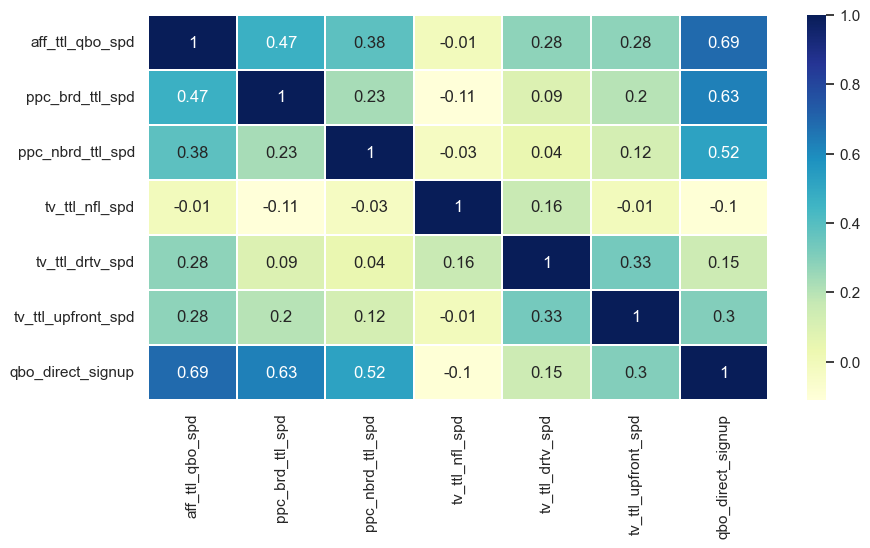

In [44]:
# remove highly correlated variables
bottom_funnel_data_copy = bottom_funnel_data.copy()
bottom_funnel_data = bottom_funnel_data.drop(['ppc_nbrd_ttl_imp', 'ppc_nbrd_ttl_clk', 'ppc_brd_ttl_imp', 'ppc_brd_ttl_clk', 'tv_ttl_nfl_imp', 
                         'tv_ttl_nfl_grps', 'tv_ttl_drtv_imp', 'tv_ttl_drtv_grps', 'tv_ttl_upfront_imp', 'tv_ttl_upfront_grps'], axis=1)

# Check correlation between variables

bottom_funnel_data_corr = round(bottom_funnel_data.corr(),2)
sns.set(font_scale=1)
plt.subplots(figsize=(10,5))

sns.heatmap(bottom_funnel_data_corr, cmap='YlGnBu', linewidth=.005, annot=True)

### TOFU spend

In [45]:
top_funnel_spend = top_funnel_data_copy.loc[:,top_funnel_data_copy.columns.str.endswith('_spd')].sum(axis=1).reset_index().set_axis(['index', 'spd_sum'], axis=1)
top_funnel_spend_data = pd.concat([top_funnel_spend['spd_sum'],top_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
top_funnel_spend_data.head()

,spd_sum,calendardate,qbo_direct_signup
0,5369635.661,2017-08-01,181039.10390
1,4925268.782,2017-08-02,199928.34040
2,4180367.423,2017-08-03,191843.52120
3,3095870.209,2017-08-04,157688.96690
4,1725479.076,2017-08-05,67901.12728


### TOFU spend 2020

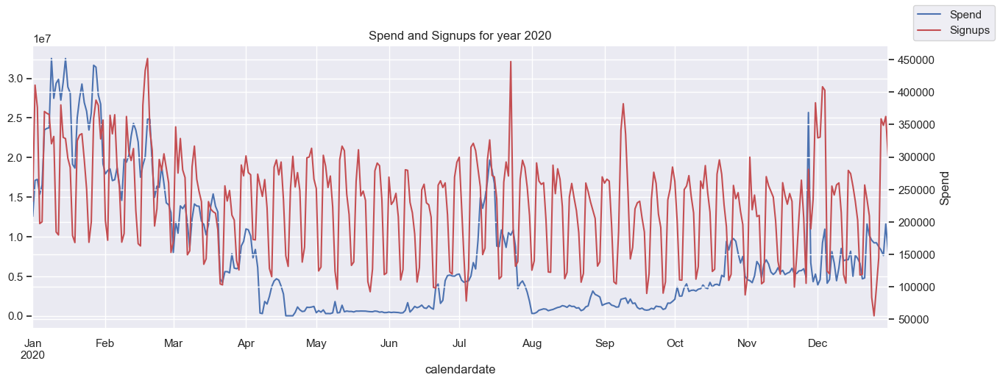

In [46]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
top_funnel_spend_data1 = top_funnel_spend_data[(top_funnel_spend_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = top_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
top_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

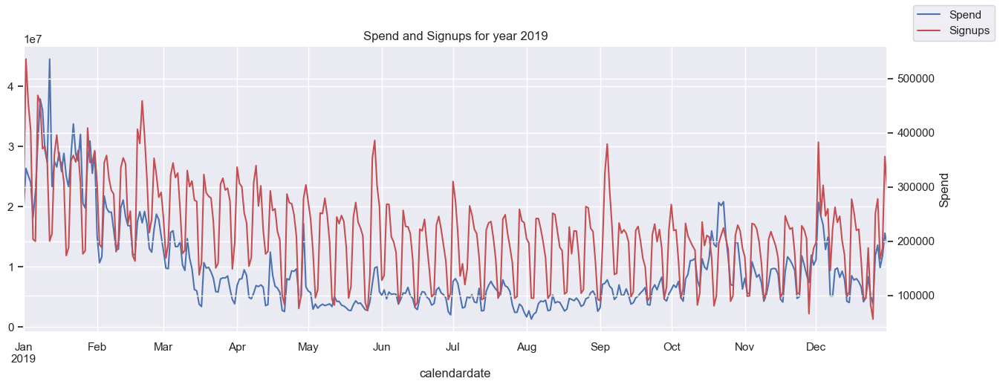

In [47]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
top_funnel_spend_data1 = top_funnel_spend_data[(top_funnel_spend_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = top_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
top_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

### TOFU Impressions

In [48]:
top_funnel_imp = top_funnel_data_copy.loc[:,top_funnel_data_copy.columns.str.endswith('_imp')].sum(axis=1).reset_index().set_axis(['index', 'imp_sum'], axis=1)
top_funnel_imp_data = pd.concat([top_funnel_imp['imp_sum'],top_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
top_funnel_imp_data.head()

,imp_sum,calendardate,qbo_direct_signup
0,2.859398e+09,2017-08-01,181039.10390
1,2.492596e+09,2017-08-02,199928.34040
2,1.857147e+09,2017-08-03,191843.52120
3,1.131682e+09,2017-08-04,157688.96690
4,7.489111e+08,2017-08-05,67901.12728


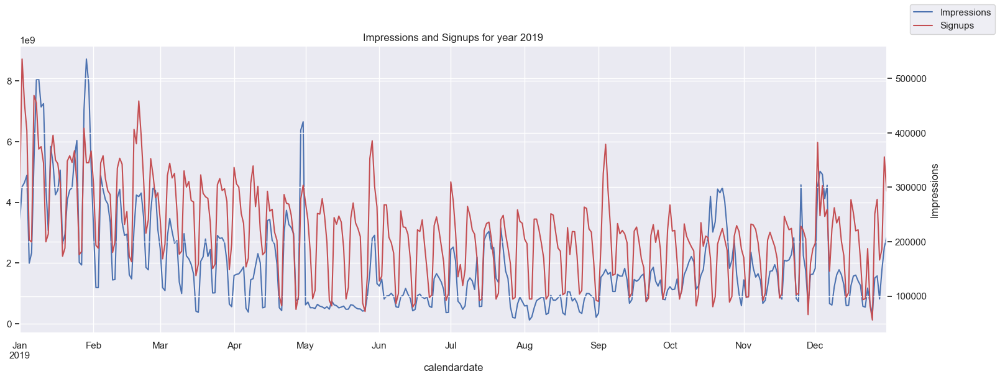

In [49]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
top_funnel_imp_data1 = top_funnel_imp_data[(top_funnel_imp_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = top_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
top_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

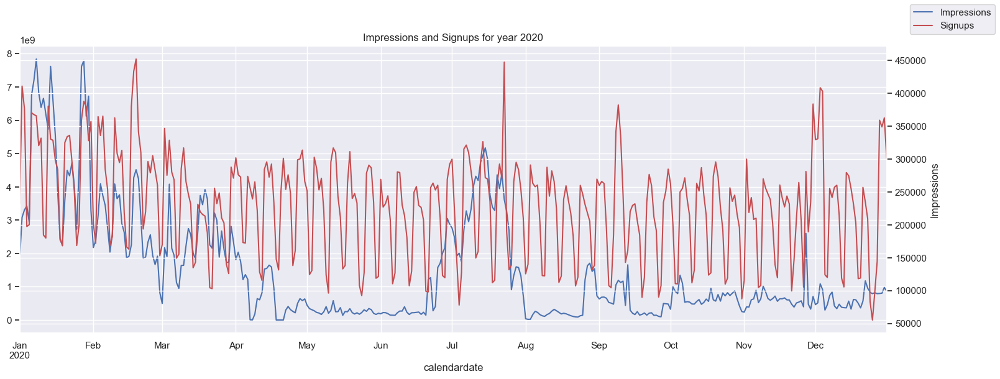

In [50]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
top_funnel_imp_data1 = top_funnel_imp_data[(top_funnel_imp_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = top_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
top_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

### MOFU spend

In [51]:
middle_funnel_spend = middle_funnel_data_copy.loc[:,middle_funnel_data_copy.columns.str.endswith('_spd')].sum(axis=1).reset_index().set_axis(['index', 'spd_sum'], axis=1)
middle_funnel_spend_data = pd.concat([middle_funnel_spend['spd_sum'],middle_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
middle_funnel_spend_data.head()

,spd_sum,calendardate,qbo_direct_signup
0,315070.2220,2017-08-01,181039.10390
1,388124.1307,2017-08-02,199928.34040
2,475425.2276,2017-08-03,191843.52120
3,272454.9222,2017-08-04,157688.96690
4,274199.3707,2017-08-05,67901.12728


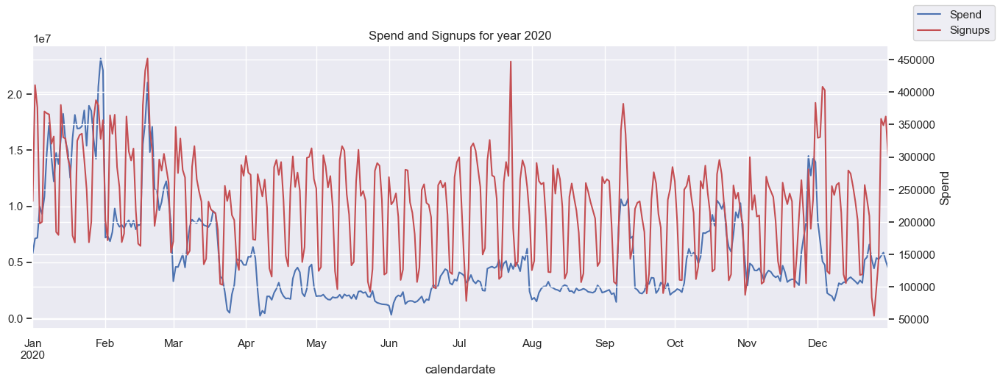

In [52]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
middle_funnel_spend_data1 = middle_funnel_spend_data[(middle_funnel_spend_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = middle_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
middle_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

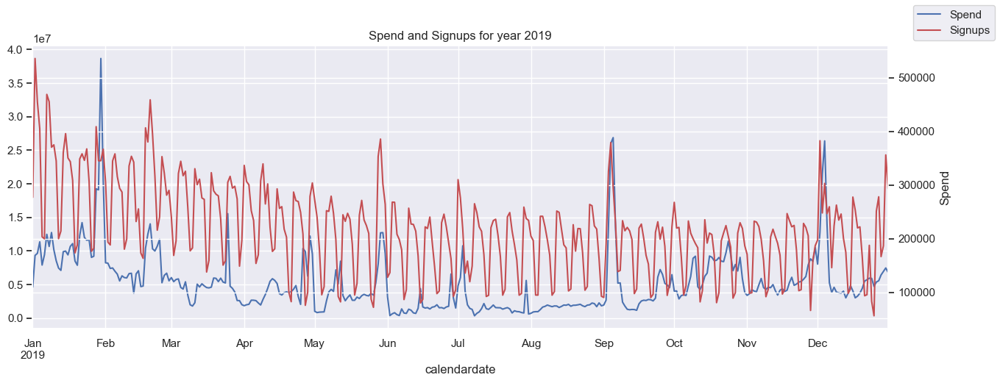

In [53]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
middle_funnel_spend_data1 = middle_funnel_spend_data[(middle_funnel_spend_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = middle_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
middle_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

In [54]:
middle_funnel_imp = middle_funnel_data_copy.loc[:,middle_funnel_data_copy.columns.str.endswith('_imp')].sum(axis=1).reset_index().set_axis(['index', 'imp_sum'], axis=1)
middle_funnel_imp_data = pd.concat([middle_funnel_imp['imp_sum'],middle_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
middle_funnel_imp_data.head()

,imp_sum,calendardate,qbo_direct_signup
0,28742810.72,2017-08-01,181039.10390
1,50341118.41,2017-08-02,199928.34040
2,72756799.88,2017-08-03,191843.52120
3,48127444.25,2017-08-04,157688.96690
4,37737967.65,2017-08-05,67901.12728


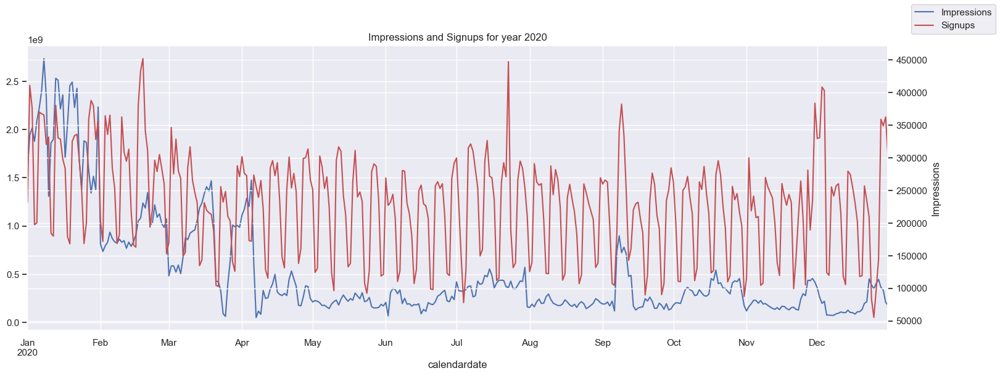

In [55]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
middle_funnel_imp_data1 = middle_funnel_imp_data[(middle_funnel_imp_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = middle_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
middle_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

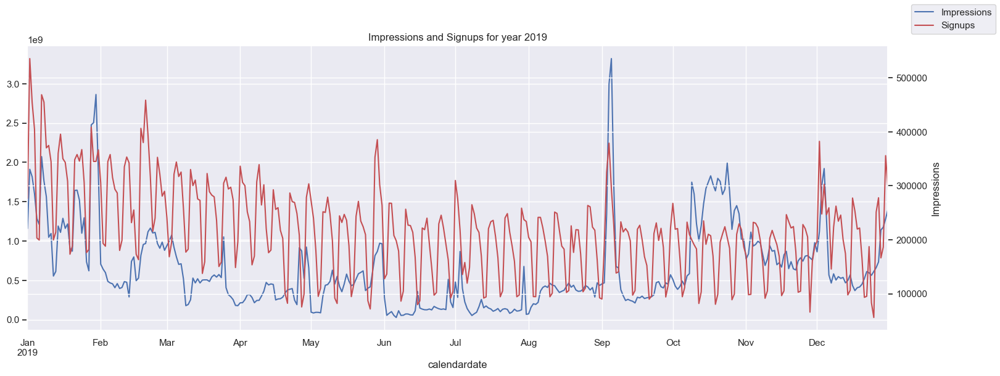

In [56]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
middle_funnel_imp_data1 = middle_funnel_imp_data[(middle_funnel_imp_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = middle_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
middle_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

### BOFU 

In [57]:
bottom_funnel_spend = bottom_funnel_data_copy.loc[:,bottom_funnel_data_copy.columns.str.endswith('_spd')].sum(axis=1).reset_index().set_axis(['index', 'spd_sum'], axis=1)
bottom_funnel_spend_data = pd.concat([bottom_funnel_spend['spd_sum'],bottom_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
bottom_funnel_spend_data.head()

,spd_sum,calendardate,qbo_direct_signup
0,1.876056e+07,2017-08-01,181039.10390
1,1.956284e+07,2017-08-02,199928.34040
2,1.916315e+07,2017-08-03,191843.52120
3,1.451115e+07,2017-08-04,157688.96690
4,8.215259e+06,2017-08-05,67901.12728


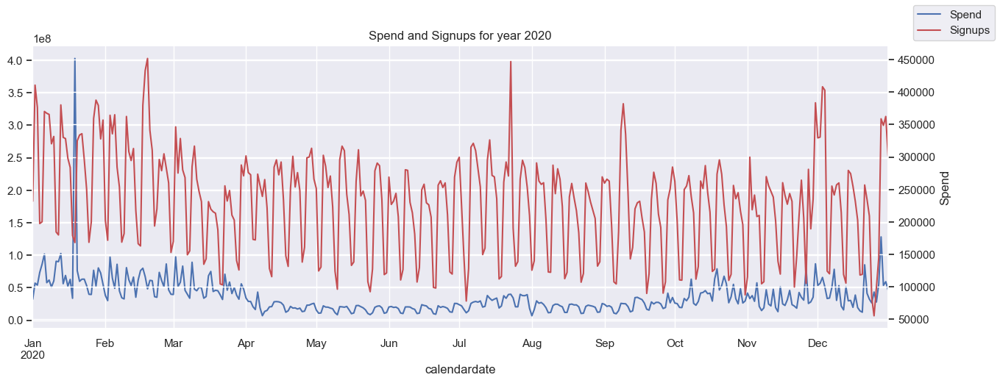

In [58]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
bottom_funnel_spend_data1 = bottom_funnel_spend_data[(bottom_funnel_spend_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = bottom_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
bottom_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

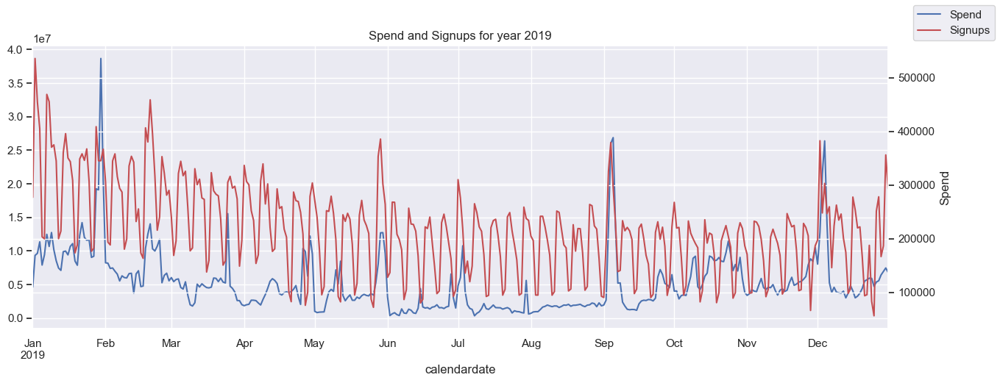

In [59]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
middle_funnel_spend_data1 = middle_funnel_spend_data[(middle_funnel_spend_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(15, 5))

# Create the line plot with twin y-axes
ax = middle_funnel_spend_data1.plot(x="calendardate", y="spd_sum", label="Spend", legend=False)
ax2 = ax.twinx()
middle_funnel_spend_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Spend and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Spend')

# Show the plot
plt.show()

In [60]:
bottom_funnel_imp = bottom_funnel_data_copy.loc[:,bottom_funnel_data_copy.columns.str.endswith('_imp')].sum(axis=1).reset_index().set_axis(['index', 'imp_sum'], axis=1)
bottom_funnel_imp_data = pd.concat([bottom_funnel_imp['imp_sum'],bottom_funnel_data_copy[['calendardate','qbo_direct_signup']]], axis=1)
bottom_funnel_imp_data.head()

,imp_sum,calendardate,qbo_direct_signup
0,91414316.20,2017-08-01,181039.10390
1,90271092.13,2017-08-02,199928.34040
2,79318651.03,2017-08-03,191843.52120
3,79193939.62,2017-08-04,157688.96690
4,32936908.04,2017-08-05,67901.12728


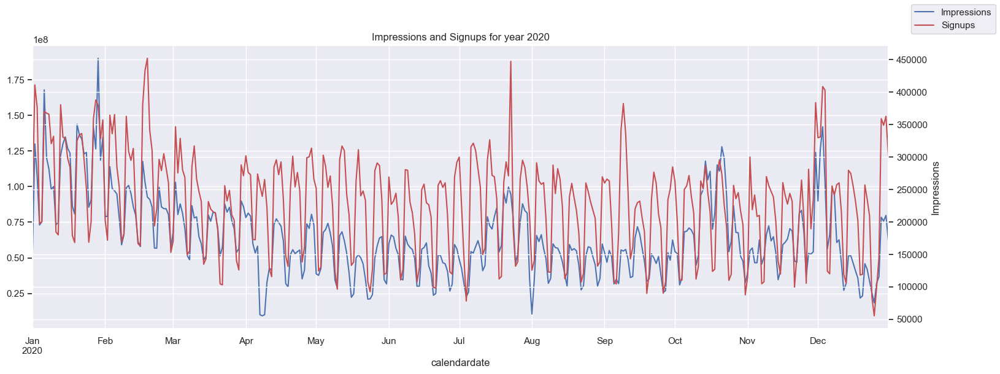

In [61]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
bottom_funnel_imp_data1 = bottom_funnel_imp_data[(bottom_funnel_imp_data['calendardate'] >= '2020-01-01')&(top_funnel_spend_data['calendardate'] < '2021-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = bottom_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
bottom_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2020')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

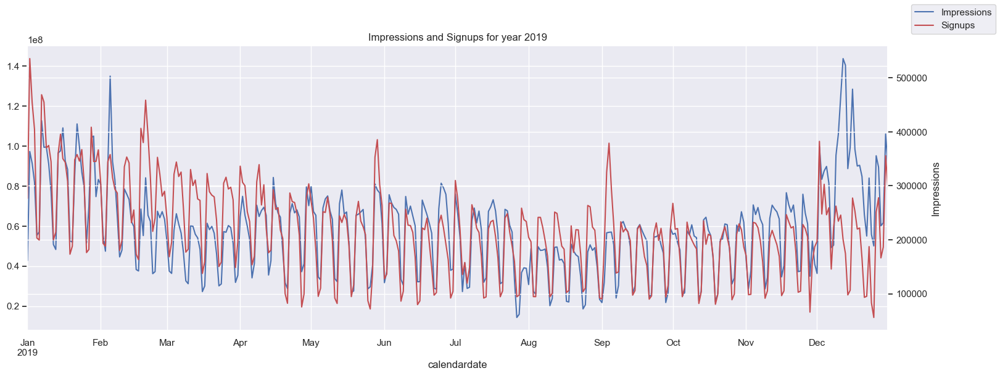

In [62]:
import matplotlib

# Assuming 'top_funnel_data' is the DataFrame containing the required data
bottom_funnel_imp_data1 = bottom_funnel_imp_data[(bottom_funnel_imp_data['calendardate'] >= '2019-01-01')&(top_funnel_spend_data['calendardate'] < '2020-01-01')]

# Set the figure size before plotting
matplotlib.rc('figure', figsize=(18, 6))

# Create the line plot with twin y-axes
ax = bottom_funnel_imp_data1.plot(x="calendardate", y="imp_sum", label="Impressions", legend=False)
ax2 = ax.twinx()
bottom_funnel_imp_data1.plot(x="calendardate", y="qbo_direct_signup", ax=ax2, label="Signups", color='r', legend=False)
ax2.figure.legend()

# Adding labels and title
plt.title('Impressions and Signups for year 2019')
plt.xlabel('Date')
plt.ylabel('Impressions')

# Show the plot
plt.show()

### Feature Engineering for TOFU

In [63]:
def weighted_mean(window):
    weights = range(1, len(window) + 1)  # Example weights, you can adjust this according to your requirement
    return (window * weights).sum() / sum(weights)

In [64]:
window_size=31
top_funnel_data['dis_ttl_spd_weighted_mean'] = top_funnel_data['dis_ttl_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
top_funnel_data['vid_ttl_spd_weighted_mean'] = top_funnel_data['vid_ttl_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
top_funnel_data['aud_ttl_nogobig_spd_weighted_mean'] = top_funnel_data['aud_ttl_nogobig_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
top_funnel_data['rad_spd_weighted_mean'] = top_funnel_data['rad_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
top_funnel_data['ott_spd_weighted_mean'] = top_funnel_data['ott_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)

In [65]:
top_funnel_data['signups_lag_1_month'] = top_funnel_data['qbo_direct_signup'].shift(31)

In [66]:
top_funnel_data = top_funnel_data.drop(['qbo_direct_signup'], axis=1)
top_funnel_df = pd.concat([non_media_data,top_funnel_data],axis=1)
top_funnel_df = top_funnel_df.drop(['calendardate'], axis=1)

In [67]:
top_funnel_df_corr = round(top_funnel_df.corr(),2)
sns.set(font_scale=5)
plt.subplots(figsize=(100,85))

sns.heatmap(top_funnel_df_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

In [68]:
top_funnel_df = top_funnel_df.drop(['dis_ttl_spd', 'vid_ttl_spd', 'aud_ttl_nogobig_spd', 'rad_spd', 'ott_spd'], axis=1)

### Feature Engineering for MOFU

In [69]:
window_size=8
middle_funnel_data['fb_ttl_core_spd_weighted_mean'] = middle_funnel_data['fb_ttl_core_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
middle_funnel_data['soc_li_core_spd_weighted_mean'] = middle_funnel_data['soc_li_core_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
middle_funnel_data['soc_tw_core_spd_spd_weighted_mean'] = middle_funnel_data['soc_tw_core_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)
middle_funnel_data['soc_pin_core_spd_weighted_mean'] = middle_funnel_data['soc_pin_core_spd'].rolling(window=window_size).apply(weighted_mean, raw=True)

middle_funnel_data['signups_lag_2_weeks'] = middle_funnel_data['qbo_direct_signup'].shift(15)

In [70]:
middle_funnel_data = middle_funnel_data.drop(['qbo_direct_signup'], axis=1)
middle_funnel_df = pd.concat([non_media_data,middle_funnel_data],axis=1)
middle_funnel_df = middle_funnel_df.drop(['calendardate'], axis=1)

In [71]:
middle_funnel_df_corr = round(middle_funnel_df.corr(),2)
sns.set(font_scale=5)
plt.subplots(figsize=(100,85))

sns.heatmap(middle_funnel_df_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

In [72]:
middle_funnel_df = middle_funnel_df.drop(['fb_ttl_core_spd', 'soc_li_core_spd', 'soc_tw_core_spd', 'soc_pin_core_spd'], axis=1)

### Feature Engineering for BOFU

In [73]:
bottom_funnel_data['signups_lag_1_day'] = bottom_funnel_data['qbo_direct_signup'].shift(1)

In [74]:
bottom_funnel_data = bottom_funnel_data.drop(['qbo_direct_signup'], axis=1)
bottom_funnel_df = pd.concat([non_media_data,bottom_funnel_data],axis=1)
bottom_funnel_df = bottom_funnel_df.drop(['calendardate'], axis=1)

In [75]:
bottom_funnel_df_corr = round(bottom_funnel_df.corr(),2)
sns.set(font_scale=5)
plt.subplots(figsize=(100,85))

sns.heatmap(bottom_funnel_df_corr, cmap='YlGnBu', linewidth=.005, annot=True)

<Axes: >

### Non media data Feature Engineering

In [76]:
#non_media_data['nasdaq'] = non_media_data['nasdaq'].replace(to_replace=0, method='ffill')
#non_media_data['nasdaq_lag_1_day'] = non_media_data['nasdaq'].shift(1)

In [77]:
(sum(df_analysis['spd_sum'])/sum(df_analysis['qbo_direct_signup']))

209.299220711629

In [78]:
top_funnel_df = top_funnel_df.drop(['nasdaq', 'ttl_app_dwnlds', 'emv', 'covid_shtdwn', 'acct_pck3for10','test_reimagineMVP', 'qbl_empower', 'qbl_agentshortage','test_reimagineMVP_2', 'price_diff_qbo_plus', 'qbo_direct_signup','promo'], axis=1)
middle_funnel_df = middle_funnel_df.drop(['nasdaq', 'ttl_app_dwnlds', 'emv', 'covid_shtdwn', 'acct_pck3for10','test_reimagineMVP', 'qbl_empower', 'qbl_agentshortage','test_reimagineMVP_2', 'price_diff_qbo_plus', 'qbo_direct_signup','promo'], axis=1)
bottom_funnel_df = bottom_funnel_df.drop(['nasdaq', 'ttl_app_dwnlds', 'emv', 'covid_shtdwn', 'acct_pck3for10','test_reimagineMVP', 'qbl_empower', 'qbl_agentshortage','test_reimagineMVP_2', 'price_diff_qbo_plus', 'qbo_direct_signup','promo'], axis=1)

In [79]:
df_final = pd.concat([top_funnel_df, middle_funnel_df, bottom_funnel_df, non_media_data], axis=1)

In [80]:
df_final = df_final.drop(['month'], axis=1)
df_final['month'] = df_final['calendardate'].dt.month
df_final = df_final.drop(['calendardate'], axis=1)

In [81]:
df_final.isnull().sum()

seo_brand_core_impressions            0
dis_ttl_spd_weighted_mean            30
vid_ttl_spd_weighted_mean            30
aud_ttl_nogobig_spd_weighted_mean    30
rad_spd_weighted_mean                30
ott_spd_weighted_mean                30
signups_lag_1_month                  31
fb_ttl_core_spd_weighted_mean         7
soc_li_core_spd_weighted_mean         7
soc_tw_core_spd_spd_weighted_mean     7
soc_pin_core_spd_weighted_mean        7
signups_lag_2_weeks                  15
aff_ttl_qbo_spd                       0
ppc_brd_ttl_spd                       0
ppc_nbrd_ttl_spd                      0
tv_ttl_nfl_spd                        0
tv_ttl_drtv_spd                       0
tv_ttl_upfront_spd                    0
signups_lag_1_day                     1
nasdaq                                0
ttl_app_dwnlds                        0
emv                                   0
covid_shtdwn                          0
acct_pck3for10                        0
test_reimagineMVP                     0


In [82]:
df_final = df_final.dropna()
df_final.shape

(1473, 32)

In [83]:
# # Separate target and independant variables

# y = df['qbo_direct_signup']
# X = df.loc[:, df.columns != 'qbo_direct_signup']

In [84]:
y = df_final['qbo_direct_signup']
X = df_final.loc[:, df_final.columns != 'qbo_direct_signup']

In [85]:
X.columns

Index(['seo_brand_core_impressions', 'dis_ttl_spd_weighted_mean',
       'vid_ttl_spd_weighted_mean', 'aud_ttl_nogobig_spd_weighted_mean',
       'rad_spd_weighted_mean', 'ott_spd_weighted_mean', 'signups_lag_1_month',
       'fb_ttl_core_spd_weighted_mean', 'soc_li_core_spd_weighted_mean',
       'soc_tw_core_spd_spd_weighted_mean', 'soc_pin_core_spd_weighted_mean',
       'signups_lag_2_weeks', 'aff_ttl_qbo_spd', 'ppc_brd_ttl_spd',
       'ppc_nbrd_ttl_spd', 'tv_ttl_nfl_spd', 'tv_ttl_drtv_spd',
       'tv_ttl_upfront_spd', 'signups_lag_1_day', 'nasdaq', 'ttl_app_dwnlds',
       'emv', 'covid_shtdwn', 'acct_pck3for10', 'test_reimagineMVP',
       'qbl_empower', 'qbl_agentshortage', 'test_reimagineMVP_2',
       'price_diff_qbo_plus', 'promo', 'month'],
      dtype='object')

In [86]:
vif = pd.DataFrame()
vif["Features"] = X.columns
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif

,Features,VIF Factor
0,seo_brand_core_impressions,13.259755
1,dis_ttl_spd_weighted_mean,15.060764
2,vid_ttl_spd_weighted_mean,13.350844
3,aud_ttl_nogobig_spd_weighted_mean,6.022844
4,rad_spd_weighted_mean,3.714881
5,ott_spd_weighted_mean,7.936514
6,signups_lag_1_month,11.577538
7,fb_ttl_core_spd_weighted_mean,9.907218
8,soc_li_core_spd_weighted_mean,2.032560
9,soc_tw_core_spd_spd_weighted_mean,3.481452


In [87]:
from sklearn.model_selection import train_test_split

# Create decision tree to help determine feature importance

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=42)
model = RandomForestRegressor(random_state=1)
model.fit(X_train, y_train)
pred = model.predict(X_test)

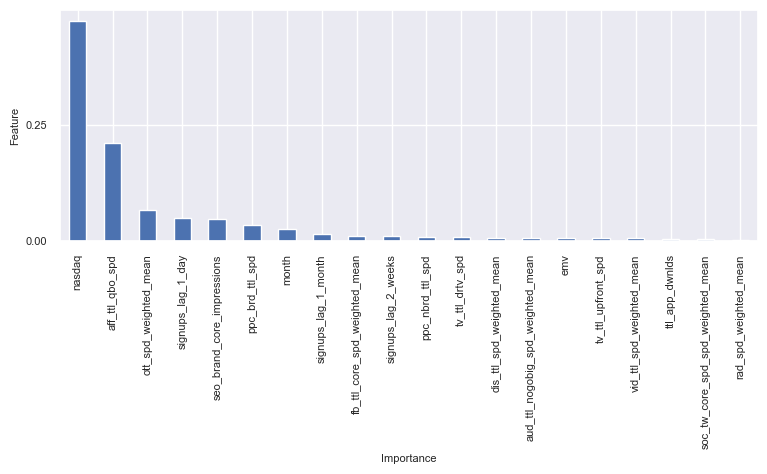

In [88]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 8})
# Assuming 'model' is your trained model, and 'X' is the feature matrix
feat_importances = pd.Series(model.feature_importances_, index=X.columns)

# Set the font size and figure size
plt.figure(figsize=(9, 3))  # Adjust the figure size as needed

# Plot the top 30 features
feat_importances.nlargest(20).plot(kind='bar' , fontsize=8)
plt.xlabel('Importance')
plt.ylabel('Feature')

# Show the plot
plt.show()

In [89]:
# from sklearn.preprocessing import StandardScaler, RobustScaler
# from sklearn.preprocessing import PowerTransformer
# from sklearn.pipeline import Pipeline

# scaler = StandardScaler()
# #scaler = RobustScaler()

# distributor = PowerTransformer(method='yeo-johnson', standardize=False)

# pipeline = Pipeline(steps=[
#     ('scaler', scaler),    #scale numbers to same magnitude before normalizing distribution
#     ('pt', distributor)    #transform numbers to more gaussian-like distribution
# ])

In [90]:
# # Fit_transform train data with preprocessor
# train_x = pipeline.fit_transform(X_train)
# print(train_x.shape)

# # Transform the test data
# test_x = pipeline.transform(X_test)
# print(test_x.shape)

In [91]:
# Calculate mean revenue

mean_value = np.mean(y_train)
# Predict all values as the mean

base_pred = np.repeat(mean_value, len(y_test))
mean_value

228698.89668036232

In [193]:
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
# Calculate error to establish baseline measurements

base_mse = mean_squared_error(y_test, base_pred)

base_rmse = np.sqrt(base_mse)
base_mape = mean_absolute_percentage_error(y_test, base_pred)
base_r_sq = r2_score(y_test, base_pred)

print('Baseline RMSE: {}' .format(base_rmse))
print('Baseline MAPE: {}' .format(base_mape))
print('Baseline R2: {}' .format(base_r_sq))

Baseline RMSE: 91002.72962054993
Baseline MAPE: 0.47875138866373196
Baseline R2: -0.009105688796429368


In [194]:
lr_model = LinearRegression(positive=True)

lr_model.fit(X_train, y_train)

LinearRegression(positive=True)

In [195]:
#Train RMSE

reg_train_pred = lr_model.predict(X_train)

lr_train_mse = mean_squared_error(y_train, reg_train_pred)
lr_train_rmse = np.sqrt(mean_squared_error (y_train, reg_train_pred))

lr_train_mape = mean_absolute_percentage_error(y_train, reg_train_pred)
lr_train_r_sq = r2_score(y_train, reg_train_pred)

print('Train RMSE: {}' .format(lr_train_rmse))
print('Train MAPE: {}' .format(lr_train_mape))
print('Train R2: {}' .format(lr_train_r_sq))

Train RMSE: 39708.78323077335
Train MAPE: 0.1424307992003312
Train R2: 0.7988408502474288


In [196]:
#Test RMSE

reg_test_pred = lr_model.predict(X_test)

lr_test_mse = mean_squared_error (y_test, reg_test_pred)

lr_test_rmse = np.sqrt(mean_squared_error (y_test, reg_test_pred))
lr_test_mape = mean_absolute_percentage_error(y_test, reg_test_pred)
lr_test_r_sq = r2_score(y_test, reg_test_pred)


print('Test RMSE: {}' .format(lr_test_rmse))
print('Test MAPE: {}' .format(lr_test_mape))
print('Test R2: {}' .format(lr_test_r_sq))

Test RMSE: 40045.951818731875
Test MAPE: 0.15522567285901254
Test R2: 0.8045907772951035


In [197]:
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': reg_test_pred})
df_results['Incremental_Units'] = df_results['Predicted'] - df_results['Actual']
print("Total incremental units", df_results['Incremental_Units'].sum())

Total incremental units 739531.7933415083


In [198]:
incremental_units_by_channel = {}
for column in X.columns:
    incremental_units_by_channel[column] = sum(((X_test[column] * (lr_model.coef_[list(X.columns).index(column)])) * (reg_test_pred - y_test))/reg_test_pred)

In [199]:
incremental_units_by_channel

{'seo_brand_core_impressions': 0.0,
 'dis_ttl_spd_weighted_mean': 13955.209884322072,
 'vid_ttl_spd_weighted_mean': 0.0,
 'aud_ttl_nogobig_spd_weighted_mean': 0.0,
 'rad_spd_weighted_mean': 0.0,
 'ott_spd_weighted_mean': 10433.161273478923,
 'signups_lag_1_month': 0.0,
 'fb_ttl_core_spd_weighted_mean': 17803.00692803046,
 'soc_li_core_spd_weighted_mean': 0.0,
 'soc_tw_core_spd_spd_weighted_mean': 0.0,
 'soc_pin_core_spd_weighted_mean': 0.0,
 'signups_lag_2_weeks': 0.0,
 'aff_ttl_qbo_spd': 442546.2170380489,
 'ppc_brd_ttl_spd': 5151.734772804707,
 'ppc_nbrd_ttl_spd': 0.0,
 'tv_ttl_nfl_spd': 0.0,
 'tv_ttl_drtv_spd': 0.0,
 'tv_ttl_upfront_spd': 31257.53407662852,
 'signups_lag_1_day': 100571.03240436557,
 'nasdaq': 78147.38159001422,
 'ttl_app_dwnlds': 0.0,
 'emv': 0.0,
 'covid_shtdwn': 0.0,
 'acct_pck3for10': 7453.393185162675,
 'test_reimagineMVP': 0.0,
 'qbl_empower': 0.0,
 'qbl_agentshortage': 5004.772252275683,
 'test_reimagineMVP_2': 0.0,
 'price_diff_qbo_plus': 0.0,
 'promo': 11364

In [200]:
channel_units = {}
channel_units['display'] = incremental_units_by_channel['dis_ttl_spd_weighted_mean']
channel_units['video'] =  incremental_units_by_channel['vid_ttl_spd_weighted_mean']
channel_units['radio'] =  incremental_units_by_channel['rad_spd_weighted_mean']
channel_units['audio'] = incremental_units_by_channel['aud_ttl_nogobig_spd_weighted_mean']
channel_units['ott'] =  incremental_units_by_channel['ott_spd_weighted_mean']
channel_units['facebook'] =  incremental_units_by_channel['fb_ttl_core_spd_weighted_mean']
channel_units['linkedin'] =  incremental_units_by_channel['soc_li_core_spd_weighted_mean']
channel_units['twitter'] = incremental_units_by_channel['soc_tw_core_spd_spd_weighted_mean']
channel_units['pinterest'] =incremental_units_by_channel['soc_pin_core_spd_weighted_mean']
channel_units['affiliate'] = incremental_units_by_channel['aff_ttl_qbo_spd']
channel_units['paid_search_brand'] = incremental_units_by_channel['ppc_brd_ttl_spd']
channel_units['paid_search_non_brand'] = incremental_units_by_channel['ppc_nbrd_ttl_spd']
channel_units['TV_NFL'] = incremental_units_by_channel['tv_ttl_nfl_spd']
channel_units['TV_DR'] = incremental_units_by_channel['tv_ttl_drtv_spd']
channel_units['TV_upfront'] = incremental_units_by_channel['tv_ttl_upfront_spd']

channel_units

{'display': 13955.209884322072,
 'video': 0.0,
 'radio': 0.0,
 'audio': 0.0,
 'ott': 10433.161273478923,
 'facebook': 17803.00692803046,
 'linkedin': 0.0,
 'twitter': 0.0,
 'pinterest': 0.0,
 'affiliate': 442546.2170380489,
 'paid_search_brand': 5151.734772804707,
 'paid_search_non_brand': 0.0,
 'TV_NFL': 0.0,
 'TV_DR': 0.0,
 'TV_upfront': 31257.53407662852}

In [201]:
channel_units_df = pd.DataFrame(data = channel_units.items(), columns=['channel', 'incremental_units'])
channel_units_df

,channel,incremental_units
0,display,13955.209884
1,video,0.000000
2,radio,0.000000
3,audio,0.000000
4,ott,10433.161273
5,facebook,17803.006928
6,linkedin,0.000000
7,twitter,0.000000
8,pinterest,0.000000
9,affiliate,442546.217038


In [202]:
channel_units_df['incremental_units'].sum()

521146.8639733136

In [203]:
incremental_units_by_channel

{'seo_brand_core_impressions': 0.0,
 'dis_ttl_spd_weighted_mean': 13955.209884322072,
 'vid_ttl_spd_weighted_mean': 0.0,
 'aud_ttl_nogobig_spd_weighted_mean': 0.0,
 'rad_spd_weighted_mean': 0.0,
 'ott_spd_weighted_mean': 10433.161273478923,
 'signups_lag_1_month': 0.0,
 'fb_ttl_core_spd_weighted_mean': 17803.00692803046,
 'soc_li_core_spd_weighted_mean': 0.0,
 'soc_tw_core_spd_spd_weighted_mean': 0.0,
 'soc_pin_core_spd_weighted_mean': 0.0,
 'signups_lag_2_weeks': 0.0,
 'aff_ttl_qbo_spd': 442546.2170380489,
 'ppc_brd_ttl_spd': 5151.734772804707,
 'ppc_nbrd_ttl_spd': 0.0,
 'tv_ttl_nfl_spd': 0.0,
 'tv_ttl_drtv_spd': 0.0,
 'tv_ttl_upfront_spd': 31257.53407662852,
 'signups_lag_1_day': 100571.03240436557,
 'nasdaq': 78147.38159001422,
 'ttl_app_dwnlds': 0.0,
 'emv': 0.0,
 'covid_shtdwn': 0.0,
 'acct_pck3for10': 7453.393185162675,
 'test_reimagineMVP': 0.0,
 'qbl_empower': 0.0,
 'qbl_agentshortage': 5004.772252275683,
 'test_reimagineMVP_2': 0.0,
 'price_diff_qbo_plus': 0.0,
 'promo': 11364

In [204]:
coef_dict = {}
for coef, feat in zip(1/lr_model.coef_,X.columns
                      ):
    coef_dict[feat] = coef

In [205]:
coef_dict

{'seo_brand_core_impressions': inf,
 'dis_ttl_spd_weighted_mean': 2247.34802150202,
 'vid_ttl_spd_weighted_mean': inf,
 'aud_ttl_nogobig_spd_weighted_mean': inf,
 'rad_spd_weighted_mean': inf,
 'ott_spd_weighted_mean': 276.84088811947225,
 'signups_lag_1_month': inf,
 'fb_ttl_core_spd_weighted_mean': 715.7552458936908,
 'soc_li_core_spd_weighted_mean': inf,
 'soc_tw_core_spd_spd_weighted_mean': inf,
 'soc_pin_core_spd_weighted_mean': inf,
 'signups_lag_2_weeks': inf,
 'aff_ttl_qbo_spd': 30.28374152103535,
 'ppc_brd_ttl_spd': 274.58673728289756,
 'ppc_nbrd_ttl_spd': inf,
 'tv_ttl_nfl_spd': inf,
 'tv_ttl_drtv_spd': inf,
 'tv_ttl_upfront_spd': 2108.8275280079956,
 'signups_lag_1_day': 9.21165032475743,
 'nasdaq': 0.12286073151645015,
 'ttl_app_dwnlds': inf,
 'emv': inf,
 'covid_shtdwn': inf,
 'acct_pck3for10': 2.0317053124234902e-05,
 'test_reimagineMVP': inf,
 'qbl_empower': inf,
 'qbl_agentshortage': 6.285374029521765e-05,
 'test_reimagineMVP_2': inf,
 'price_diff_qbo_plus': inf,
 'prom

In [206]:
channel_cpa = {}
channel_cpa['display'] = coef_dict['dis_ttl_spd_weighted_mean']
channel_cpa['video'] = coef_dict['vid_ttl_spd_weighted_mean']
channel_cpa['radio'] =  coef_dict['rad_spd_weighted_mean']
channel_cpa['audio'] =  coef_dict['aud_ttl_nogobig_spd_weighted_mean']
channel_cpa['ott'] =  coef_dict['ott_spd_weighted_mean']
channel_cpa['facebook'] = coef_dict['fb_ttl_core_spd_weighted_mean']
channel_cpa['linkedin'] =  coef_dict['soc_li_core_spd_weighted_mean']
channel_cpa['twitter'] =  coef_dict['soc_tw_core_spd_spd_weighted_mean']
channel_cpa['pinterest'] = coef_dict['soc_pin_core_spd_weighted_mean']
channel_cpa['affiliate'] = coef_dict['aff_ttl_qbo_spd']
channel_cpa['paid_search_brand'] = coef_dict['ppc_brd_ttl_spd']
channel_cpa['paid_search_non_brand'] = coef_dict['ppc_nbrd_ttl_spd']
channel_cpa['TV_NFL'] = coef_dict['tv_ttl_nfl_spd']
channel_cpa['TV_DR'] = coef_dict['tv_ttl_drtv_spd']
channel_cpa['TV_upfront'] = coef_dict['tv_ttl_upfront_spd']

channel_cpa

{'display': 2247.34802150202,
 'video': inf,
 'radio': inf,
 'audio': inf,
 'ott': 276.84088811947225,
 'facebook': 715.7552458936908,
 'linkedin': inf,
 'twitter': inf,
 'pinterest': inf,
 'affiliate': 30.28374152103535,
 'paid_search_brand': 274.58673728289756,
 'paid_search_non_brand': inf,
 'TV_NFL': inf,
 'TV_DR': inf,
 'TV_upfront': 2108.8275280079956}

In [207]:
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import RidgeCV
from numpy import arange

# Instantiate and fit ridge regression model

cv = RepeatedKFold(n_splits=10, n_repeats=5, random_state=1)

ridge_reg = RidgeCV(alphas=arange(1,10,0.5), cv=cv)

ridge_reg.fit(X_train, y_train)

RidgeCV(alphas=array([1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. , 6.5, 7. ,
       7.5, 8. , 8.5, 9. , 9.5]),
        cv=RepeatedKFold(n_repeats=5, n_splits=10, random_state=1))

In [120]:
# from sklearn.linear_model import Ridge
# from numpy import arange

# ridge_reg = Ridge(alpha=2.5, positive=True)
# ridge_reg.fit(X_train, y_train)

In [121]:
print('An alpha of {} was used.' .format(ridge_reg.alpha_))

An alpha of 2.5 was used.


In [122]:
#Train RMSE

reg_train_pred = ridge_reg.predict(X_train)

ridge_train_mse = mean_squared_error(y_train, reg_train_pred)
ridge_train_rmse = np.sqrt(mean_squared_error (y_train, reg_train_pred))
ridge_train_mape = mean_absolute_percentage_error(y_train, reg_train_pred)
ridge_train_r_sq = r2_score(y_train, reg_train_pred)

print('Train RMSE: {}' .format(ridge_train_rmse))
print('Train MAPE: {}' .format(ridge_train_mape))
print('Train R2: {}' .format(ridge_train_r_sq))

Train RMSE: 35507.88959514671
Train MAPE: 0.12738523486585707
Train R2: 0.8391517448730469


In [123]:
#Test RMSE

reg_test_pred = ridge_reg.predict(X_test)

ridge_test_mse = mean_squared_error (y_test, reg_test_pred)
ridge_test_rmse = np.sqrt(mean_squared_error (y_test, reg_test_pred))
ridge_test_mape = mean_absolute_percentage_error(y_test, reg_test_pred)
ridge_test_r_sq = r2_score(y_test, reg_test_pred)


print('Test RMSE: {}' .format(ridge_test_rmse))
print('Test MAPE: {}' .format(ridge_test_mape))
print('Test R2: {}' .format(ridge_test_r_sq))

Test RMSE: 36303.547684274905
Test MAPE: 0.14545095535752015
Test R2: 0.8394072439675505


In [124]:
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': reg_test_pred})
df_results['Incremental_Units'] = df_results['Predicted'] - df_results['Actual']
print("Total incremental units", df_results['Incremental_Units'].sum())

Total incremental units 488426.9291623859


In [128]:
incremental_units_by_channel = {}
for column in X.columns:
    incremental_units_by_channel[column] = sum(((X_test[column] * (ridge_reg.coef_[list(X.columns).index(column)])) * (reg_test_pred - y_test))/reg_test_pred)

In [129]:
incremental_units_by_channel

{'seo_brand_core_impressions': 75043.77131815082,
 'dis_ttl_spd_weighted_mean': 33081.68908475963,
 'vid_ttl_spd_weighted_mean': 6157.5602490919155,
 'aud_ttl_nogobig_spd_weighted_mean': -13224.52556489614,
 'rad_spd_weighted_mean': -3745.2375352665686,
 'ott_spd_weighted_mean': 472.3352572061681,
 'signups_lag_1_month': -1933.3342970034319,
 'fb_ttl_core_spd_weighted_mean': 21953.269574985094,
 'soc_li_core_spd_weighted_mean': -1171.873060130554,
 'soc_tw_core_spd_spd_weighted_mean': -2236.7737567404056,
 'soc_pin_core_spd_weighted_mean': 1509.2763691932837,
 'signups_lag_2_weeks': -77170.87948937355,
 'aff_ttl_qbo_spd': 206733.0703100971,
 'ppc_brd_ttl_spd': -36191.318498202665,
 'ppc_nbrd_ttl_spd': 7158.279089049272,
 'tv_ttl_nfl_spd': -3674.5582234385065,
 'tv_ttl_drtv_spd': 16113.44106575001,
 'tv_ttl_upfront_spd': 21705.206791307864,
 'signups_lag_1_day': 87841.30736664774,
 'nasdaq': 8176.42826113792,
 'ttl_app_dwnlds': 12991.212523778402,
 'emv': -7956.763497091948,
 'covid_sht

In [131]:
channel_units = {}
channel_units['display'] = incremental_units_by_channel['dis_ttl_spd_weighted_mean']
channel_units['video'] =  incremental_units_by_channel['vid_ttl_spd_weighted_mean']
channel_units['radio'] =  incremental_units_by_channel['rad_spd_weighted_mean']
channel_units['audio'] = incremental_units_by_channel['aud_ttl_nogobig_spd_weighted_mean']
channel_units['ott'] =  incremental_units_by_channel['ott_spd_weighted_mean']
channel_units['facebook'] =  incremental_units_by_channel['fb_ttl_core_spd_weighted_mean']
channel_units['linkedin'] =  incremental_units_by_channel['soc_li_core_spd_weighted_mean']
channel_units['twitter'] = incremental_units_by_channel['soc_tw_core_spd_spd_weighted_mean']
channel_units['pinterest'] =incremental_units_by_channel['soc_pin_core_spd_weighted_mean']
channel_units['affiliate'] = incremental_units_by_channel['aff_ttl_qbo_spd']
channel_units['paid_search_brand'] = incremental_units_by_channel['ppc_brd_ttl_spd']
channel_units['paid_search_non_brand'] = incremental_units_by_channel['ppc_nbrd_ttl_spd']
channel_units['TV_NFL'] = incremental_units_by_channel['tv_ttl_nfl_spd']
channel_units['TV_DR'] = incremental_units_by_channel['tv_ttl_drtv_spd']
channel_units['TV_upfront'] = incremental_units_by_channel['tv_ttl_upfront_spd']

channel_units

{'display': 33081.68908475963,
 'video': 6157.5602490919155,
 'radio': -3745.2375352665686,
 'audio': -13224.52556489614,
 'ott': 472.3352572061681,
 'facebook': 21953.269574985094,
 'linkedin': -1171.873060130554,
 'twitter': -2236.7737567404056,
 'pinterest': 1509.2763691932837,
 'affiliate': 206733.0703100971,
 'paid_search_brand': -36191.318498202665,
 'paid_search_non_brand': 7158.279089049272,
 'TV_NFL': -3674.5582234385065,
 'TV_DR': 16113.44106575001,
 'TV_upfront': 21705.206791307864}

In [132]:
channel_units_df = pd.DataFrame(data = channel_units.items(), columns=['channel', 'incremental_units'])
channel_units_df

,channel,incremental_units
0,display,33081.689085
1,video,6157.560249
2,radio,-3745.237535
3,audio,-13224.525565
4,ott,472.335257
5,facebook,21953.269575
6,linkedin,-1171.873060
7,twitter,-2236.773757
8,pinterest,1509.276369
9,affiliate,206733.070310


In [133]:
channel_units_df['incremental_units'].sum()

254639.8411527655

In [134]:
coef_dict = {}
for coef, feat in zip(ridge_reg.coef_,X.columns):
    coef_dict[feat] = 1/coef

In [135]:
coef_dict

{'seo_brand_core_impressions': -417.4605078265645,
 'dis_ttl_spd_weighted_mean': 652.4080876120132,
 'vid_ttl_spd_weighted_mean': 4987.927729732903,
 'aud_ttl_nogobig_spd_weighted_mean': -43.95900175827298,
 'rad_spd_weighted_mean': 335.7929777032701,
 'ott_spd_weighted_mean': 686.3481219576455,
 'signups_lag_1_month': -8.093318234103453,
 'fb_ttl_core_spd_weighted_mean': 486.45496941303776,
 'soc_li_core_spd_weighted_mean': -89.87891781634063,
 'soc_tw_core_spd_spd_weighted_mean': -355.6203161531973,
 'soc_pin_core_spd_weighted_mean': 27.960166743759988,
 'signups_lag_2_weeks': -6.82837154362803,
 'aff_ttl_qbo_spd': 41.287875910773295,
 'ppc_brd_ttl_spd': 242.77132239162145,
 'ppc_nbrd_ttl_spd': 910.580471321234,
 'tv_ttl_nfl_spd': -7131.688392804902,
 'tv_ttl_drtv_spd': 1734.5802837478998,
 'tv_ttl_upfront_spd': 2329.3006077349974,
 'signups_lag_1_day': 6.642739693171734,
 'nasdaq': 0.11071763129592432,
 'ttl_app_dwnlds': 0.0019223461837811415,
 'emv': -0.00014364525765082965,
 'covi

In [136]:
channel_cpa = {}
channel_cpa['display'] = coef_dict['dis_ttl_spd_weighted_mean']
channel_cpa['video'] = coef_dict['vid_ttl_spd_weighted_mean']
channel_cpa['radio'] =  coef_dict['rad_spd_weighted_mean']
channel_cpa['audio'] =  coef_dict['aud_ttl_nogobig_spd_weighted_mean']
channel_cpa['ott'] =  coef_dict['ott_spd_weighted_mean']
channel_cpa['facebook'] = coef_dict['fb_ttl_core_spd_weighted_mean']
channel_cpa['linkedin'] =  coef_dict['soc_li_core_spd_weighted_mean']
channel_cpa['twitter'] =  coef_dict['soc_tw_core_spd_spd_weighted_mean']
channel_cpa['pinterest'] = coef_dict['soc_pin_core_spd_weighted_mean']
channel_cpa['affiliate'] = coef_dict['aff_ttl_qbo_spd']
channel_cpa['paid_search_brand'] = coef_dict['ppc_brd_ttl_spd']
channel_cpa['paid_search_non_brand'] = coef_dict['ppc_nbrd_ttl_spd']
channel_cpa['TV_NFL'] = coef_dict['tv_ttl_nfl_spd']
channel_cpa['TV_DR'] = coef_dict['tv_ttl_drtv_spd']
channel_cpa['TV_upfront'] = coef_dict['tv_ttl_upfront_spd']

channel_cpa

{'display': 652.4080876120132,
 'video': 4987.927729732903,
 'radio': 335.7929777032701,
 'audio': -43.95900175827298,
 'ott': 686.3481219576455,
 'facebook': 486.45496941303776,
 'linkedin': -89.87891781634063,
 'twitter': -355.6203161531973,
 'pinterest': 27.960166743759988,
 'affiliate': 41.287875910773295,
 'paid_search_brand': 242.77132239162145,
 'paid_search_non_brand': 910.580471321234,
 'TV_NFL': -7131.688392804902,
 'TV_DR': 1734.5802837478998,
 'TV_upfront': 2329.3006077349974}

In [176]:
from sklearn.linear_model import ElasticNetCV

# Instantiate and fit elastic net model

cv = RepeatedKFold(n_splits=10, n_repeats=5, random_state=1)

elastic_net = ElasticNetCV(l1_ratio=0.1, alphas=arange(0.0001,1,0.001), cv=cv, max_iter=5000, positive=True)

elastic_net.fit(X_train, y_train)

ElasticNetCV(alphas=array([1.000e-04, 1.100e-03, 2.100e-03, 3.100e-03, 4.100e-03, 5.100e-03,
       6.100e-03, 7.100e-03, 8.100e-03, 9.100e-03, 1.010e-02, 1.110e-02,
       1.210e-02, 1.310e-02, 1.410e-02, 1.510e-02, 1.610e-02, 1.710e-02,
       1.810e-02, 1.910e-02, 2.010e-02, 2.110e-02, 2.210e-02, 2.310e-02,
       2.410e-02, 2.510e-02, 2.610e-02, 2.710e-02, 2.810e-02, 2.910e-02,
       3.010e-02, 3.110e-02, 3.2...
       9.721e-01, 9.731e-01, 9.741e-01, 9.751e-01, 9.761e-01, 9.771e-01,
       9.781e-01, 9.791e-01, 9.801e-01, 9.811e-01, 9.821e-01, 9.831e-01,
       9.841e-01, 9.851e-01, 9.861e-01, 9.871e-01, 9.881e-01, 9.891e-01,
       9.901e-01, 9.911e-01, 9.921e-01, 9.931e-01, 9.941e-01, 9.951e-01,
       9.961e-01, 9.971e-01, 9.981e-01, 9.991e-01]),
             cv=RepeatedKFold(n_repeats=5, n_splits=10, random_state=1),
             l1_ratio=0.1, max_iter=5000, positive=True)

In [177]:
print("Convergence occured at {} iterations." .format(elastic_net.n_iter_))

Convergence occured at 74 iterations.


In [178]:
#Train RMSE

reg_train_pred = elastic_net.predict(X_train)

en_train_mse = mean_squared_error(y_train, reg_train_pred)
en_train_rmse = np.sqrt(mean_squared_error (y_train, reg_train_pred))
en_train_mape = mean_absolute_percentage_error(y_train, reg_train_pred)
en_train_r_sq = r2_score(y_train, reg_train_pred)

print('Train RMSE: {}' .format(en_train_rmse))
print('Train MAPE: {}' .format(en_train_mape))
print('Train R2: {}' .format(en_train_r_sq))

Train RMSE: 39714.52500938637
Train MAPE: 0.14247661095489442
Train R2: 0.7987826719445155


In [179]:
#Test RMSE

reg_test_pred = elastic_net.predict(X_test)

en_test_mse = mean_squared_error (y_test, reg_test_pred)
en_test_rmse = np.sqrt(mean_squared_error (y_test, reg_test_pred))
en_test_mape = mean_absolute_percentage_error(y_test, reg_test_pred)
en_test_r_sq = r2_score(y_test, reg_test_pred)


print('Test RMSE: {}' .format(en_test_rmse))
print('Test MAPE: {}' .format(en_test_mape))
print('Test R2: {}' .format(en_test_r_sq))

Test RMSE: 40074.640901676685
Test MAPE: 0.15542112647636228
Test R2: 0.8043106930786382


In [180]:
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': reg_test_pred})
df_results['Incremental_Units'] = df_results['Predicted'] - df_results['Actual']
print("Total incremental units", df_results['Incremental_Units'].sum())

Total incremental units 744736.175059139


In [181]:
incremental_units_by_channel = {}
for column in X.columns:
    incremental_units_by_channel[column] = sum(((X_test[column] * (elastic_net.coef_[list(X.columns).index(column)])) * (reg_test_pred - y_test))/reg_test_pred)

In [182]:
channel_units = {}
channel_units['display'] = incremental_units_by_channel['dis_ttl_spd_weighted_mean']
channel_units['video'] =  incremental_units_by_channel['vid_ttl_spd_weighted_mean']
channel_units['radio'] =  incremental_units_by_channel['rad_spd_weighted_mean']
channel_units['audio'] = incremental_units_by_channel['aud_ttl_nogobig_spd_weighted_mean']
channel_units['ott'] =  incremental_units_by_channel['ott_spd_weighted_mean']
channel_units['facebook'] =  incremental_units_by_channel['fb_ttl_core_spd_weighted_mean']
channel_units['linkedin'] =  incremental_units_by_channel['soc_li_core_spd_weighted_mean']
channel_units['twitter'] = incremental_units_by_channel['soc_tw_core_spd_spd_weighted_mean']
channel_units['pinterest'] =incremental_units_by_channel['soc_pin_core_spd_weighted_mean']
channel_units['affiliate'] = incremental_units_by_channel['aff_ttl_qbo_spd']
channel_units['paid_search_brand'] = incremental_units_by_channel['ppc_brd_ttl_spd']
channel_units['paid_search_non_brand'] = incremental_units_by_channel['ppc_nbrd_ttl_spd']
channel_units['TV_NFL'] = incremental_units_by_channel['tv_ttl_nfl_spd']
channel_units['TV_DR'] = incremental_units_by_channel['tv_ttl_drtv_spd']
channel_units['TV_upfront'] = incremental_units_by_channel['tv_ttl_upfront_spd']

channel_units

{'display': 15126.577263302122,
 'video': 0.0,
 'radio': 0.0,
 'audio': 0.0,
 'ott': 11251.911192230165,
 'facebook': 17210.28599205859,
 'linkedin': 0.0,
 'twitter': 0.0,
 'pinterest': 0.0,
 'affiliate': 450120.18131569907,
 'paid_search_brand': 5733.945804455516,
 'paid_search_non_brand': 0.0,
 'TV_NFL': 0.0,
 'TV_DR': 0.0,
 'TV_upfront': 31525.139830456916}

In [183]:
channel_units_df = pd.DataFrame(data = channel_units.items(), columns=['channel', 'incremental_units'])
channel_units_df

,channel,incremental_units
0,display,15126.577263
1,video,0.000000
2,radio,0.000000
3,audio,0.000000
4,ott,11251.911192
5,facebook,17210.285992
6,linkedin,0.000000
7,twitter,0.000000
8,pinterest,0.000000
9,affiliate,450120.181316


In [184]:
channel_units_df['incremental_units'].sum()

530968.0413982023

In [185]:
coef_dict = {}
for coef, feat in zip(elastic_net.coef_,X.columns):
    coef_dict[feat] = 1/coef

In [186]:
coef_dict

{'seo_brand_core_impressions': inf,
 'dis_ttl_spd_weighted_mean': 2094.479526022291,
 'vid_ttl_spd_weighted_mean': inf,
 'aud_ttl_nogobig_spd_weighted_mean': inf,
 'rad_spd_weighted_mean': inf,
 'ott_spd_weighted_mean': 266.50218753227466,
 'signups_lag_1_month': inf,
 'fb_ttl_core_spd_weighted_mean': 753.3746042510944,
 'soc_li_core_spd_weighted_mean': inf,
 'soc_tw_core_spd_spd_weighted_mean': inf,
 'soc_pin_core_spd_weighted_mean': inf,
 'signups_lag_2_weeks': inf,
 'aff_ttl_qbo_spd': 30.208471097259938,
 'ppc_brd_ttl_spd': 278.17800506862926,
 'ppc_nbrd_ttl_spd': inf,
 'tv_ttl_nfl_spd': inf,
 'tv_ttl_drtv_spd': inf,
 'tv_ttl_upfront_spd': 2081.140926602813,
 'signups_lag_1_day': 9.080576188416833,
 'nasdaq': 0.12282364821313593,
 'ttl_app_dwnlds': inf,
 'emv': inf,
 'covid_shtdwn': inf,
 'acct_pck3for10': 2.1694328941192687e-05,
 'test_reimagineMVP': inf,
 'qbl_empower': inf,
 'qbl_agentshortage': 6.861737275138227e-05,
 'test_reimagineMVP_2': inf,
 'price_diff_qbo_plus': inf,
 'pr

In [191]:
channel_cpa = {}
channel_cpa['display'] = coef_dict['dis_ttl_spd_weighted_mean']
channel_cpa['video'] = coef_dict['vid_ttl_spd_weighted_mean']
channel_cpa['radio'] =  coef_dict['rad_spd_weighted_mean']
channel_cpa['audio'] =  coef_dict['aud_ttl_nogobig_spd_weighted_mean']
channel_cpa['ott'] =  coef_dict['ott_spd_weighted_mean']
channel_cpa['facebook'] = coef_dict['fb_ttl_core_spd_weighted_mean']
channel_cpa['linkedin'] =  coef_dict['soc_li_core_spd_weighted_mean']
channel_cpa['twitter'] =  coef_dict['soc_tw_core_spd_spd_weighted_mean']
channel_cpa['pinterest'] = coef_dict['soc_pin_core_spd_weighted_mean']
channel_cpa['affiliate'] = coef_dict['aff_ttl_qbo_spd']
channel_cpa['paid_search_brand'] = coef_dict['ppc_brd_ttl_spd']
channel_cpa['paid_search_non_brand'] = coef_dict['ppc_nbrd_ttl_spd']
channel_cpa['TV_NFL'] = coef_dict['tv_ttl_nfl_spd']
channel_cpa['TV_DR'] = coef_dict['tv_ttl_drtv_spd']
channel_cpa['TV_upfront'] = coef_dict['tv_ttl_upfront_spd']

channel_cpa

{'display': 2094.479526022291,
 'video': inf,
 'radio': inf,
 'audio': inf,
 'ott': 266.50218753227466,
 'facebook': 753.3746042510944,
 'linkedin': inf,
 'twitter': inf,
 'pinterest': inf,
 'affiliate': 30.208471097259938,
 'paid_search_brand': 278.17800506862926,
 'paid_search_non_brand': inf,
 'TV_NFL': inf,
 'TV_DR': inf,
 'TV_upfront': 2081.140926602813}

In [188]:
channel_cpa = {}
channel_cpa['display'] = abs(coef_dict['dis_ttl_spd'] + coef_dict['dis_ttl_spd_weighted_mean'])
channel_cpa['video'] = abs(coef_dict['vid_ttl_spd'] + coef_dict['vid_ttl_spd_weighted_mean'])
channel_cpa['radio'] = abs(coef_dict['rad_spd'] + coef_dict['rad_spd_weighted_mean'])
channel_cpa['audio'] = abs(coef_dict['aud_ttl_nogobig_spd'] + coef_dict['aud_ttl_nogobig_spd_weighted_mean'])
channel_cpa['ott'] = abs(coef_dict['ott_spd'] + coef_dict['ott_spd_weighted_mean'])
channel_cpa['facebook'] = abs(coef_dict['fb_ttl_core_spd'] + coef_dict['fb_ttl_core_spd_weighted_mean'])
channel_cpa['linkedin'] = abs(coef_dict['soc_li_core_spd'] + coef_dict['soc_li_core_spd_weighted_mean'])
channel_cpa['twitter'] = abs(coef_dict['soc_tw_core_spd'] + coef_dict['soc_tw_core_spd_spd_weighted_mean'])
channel_cpa['pinterest'] = abs(coef_dict['soc_pin_core_spd'] + coef_dict['soc_pin_core_spd_weighted_mean'])
channel_cpa['affiliate'] = abs(coef_dict['aff_ttl_qbo_spd'])
channel_cpa['paid_search_brand'] = abs(coef_dict['ppc_brd_ttl_spd'])
channel_cpa['paid_search_non_brand'] = abs(coef_dict['ppc_nbrd_ttl_spd'])
channel_cpa['TV_NFL'] = abs(coef_dict['tv_ttl_nfl_spd'])
channel_cpa['TV_DR'] = abs(coef_dict['tv_ttl_drtv_spd'])
channel_cpa['TV_upfront'] = abs(coef_dict['tv_ttl_upfront_spd'])

channel_cpa

KeyError: 'dis_ttl_spd'

In [192]:
channel_cpa_df = pd.DataFrame(data = channel_cpa.items(), columns=['channel', 'cpa'])
channel_cpa_df

,channel,cpa
0,display,2094.479526
1,video,inf
2,radio,inf
3,audio,inf
4,ott,266.502188
5,facebook,753.374604
6,linkedin,inf
7,twitter,inf
8,pinterest,inf
9,affiliate,30.208471


In [208]:
channel_cpa_df.replace([np.inf, -np.inf], 0, inplace=True)

In [209]:
channel_cpa_df

,channel,cpa
0,display,2094.479526
1,video,0.000000
2,radio,0.000000
3,audio,0.000000
4,ott,266.502188
5,facebook,753.374604
6,linkedin,0.000000
7,twitter,0.000000
8,pinterest,0.000000
9,affiliate,30.208471
